In [65]:
# Python packages and utilities
import os
from datetime import datetime
import pandas as pd
import numpy as np
from IPython.display import display, HTML

try:
    import mlxtend
except ModuleNotFoundError:
     !pip install mlxtend

#RDKit
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Draw
from rdkit.Chem.Draw import DrawingOptions
from rdkit.Chem import Descriptors, rdMolDescriptors
from rdkit.Chem import Crippen
from rdkit.ML.Cluster import Butina
from rdkit import DataStructs
from rdkit.ML.Descriptors import MoleculeDescriptors
from rdkit.Chem import rdmolfiles
from rdkit.Chem import rdmolops
# from rdkit.Chem import rdDistGeom

try:
    import py3Dmol
except ModuleNotFoundError:
    !pip install py3Dmol
    import py3Dmol

from rdkit.Chem.Draw import rdMolDraw2D
try:
    import Image
except ImportError:
    from PIL import Image
from io import BytesIO

# Mordred
try:
    import mordred
    from mordred import Calculator, descriptors
except ModuleNotFoundError:
    !pip install 'mordred[full]'
    import mordred
    from mordred import Calculator, descriptors
    

# scikit-learn
try:
    import sklearn
except ModuleNotFoundError:
    !pip install -U scikit-learn
    import sklearn
    
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, KFold
from sklearn.feature_selection import RFECV, RFE
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, KFold
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import RFECV, RFE
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression, LassoCV, Ridge, BayesianRidge
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn import svm 
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel
from sklearn.gaussian_process.kernels import RBF, Matern, WhiteKernel
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler # This is sklearns auto-scaling function
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import ExtraTreesRegressor, GradientBoostingRegressor, RandomForestRegressor
from sklearn import linear_model

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier,ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.gaussian_process import GaussianProcessClassifier

try:
    import smogn
except ModuleNotFoundError:
    !pip install smogn
    import smogn

#imbalanced learn
try:
    from imblearn.over_sampling import SMOTE
    from imblearn.over_sampling import SMOTENC
    from imblearn.over_sampling import SMOTEN
except ModuleNotFoundError:
    !pip install -U imbalanced-learn
    from imblearn.over_sampling import SMOTE
    from imblearn.over_sampling import SMOTENC
    from imblearn.over_sampling import SMOTEN

try:
    import seaborn as sns
except ModuleNotFoundError:
    !pip install seaborn
    import seaborn as sns

# matplotlib
import matplotlib.pyplot as plt

# scikitplot library
try:
    import scikitplot as skplt
except ModuleNotFoundError:
    !pip install scikit-plot
    import scikitplot as skplt

#!pip install pip install -U imbalanced-learn

# own module
from pythia import classification_metrics as cmetrics
from pythia import fingerprints_generation as fp
from pythia import molecules_and_structures as mi
from pythia import plots as pltsk
from pythia import workflow_functions as cwf

# utility
%load_ext autoreload
%autoreload 2
%aimport
import importlib

import logging 
logging.basicConfig(format='%(message)s')
log = logging.getLogger()
log.setLevel(logging.INFO)

random_seed = 10459
np.random.seed = random_seed
np.random.RandomState(random_seed)
log.info(f"Random seed fixed as {random_seed}")

pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 10)

cmap = sns.diverging_palette(230, 20, as_cmap=True)

Random seed fixed as 10459


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Modules to reload:
all-except-skipped

Modules to skip:



# Load target data

First we read the dataset from a csv file. A csv file is a comma separated file, where each row is a data point.

`pd.read_csv()` is used to read the input csv file that contain the dataset. The dataset is stored in a dataframe, which is a data structure provided by the pandas library. A dataframe is a two-dimensional data structure, i.e. data is aligned in a tabular fashion in rows and columns. The dataframe can be indexed by column names.

Here, we also reformat the column names to replace spaces with underscores and make the column names all lower case. This is done to make it easier to work with the data.

In [43]:
# pd.read_csv is used to read the input csv file that contain the dataset. 
data = pd.read_csv("../Notebook-dataset-analysis/df_all_substructure_onehot.csv")

# This line of code is used to rename the columns of the dataframe to remove spaces and make them lowercase.
data.columns = ["_".join(ent.lower().strip().split(" ")) for ent in data.columns]

Here we print the column names to see what columns are available in the dataset.

In [44]:
log.info("Columns: {}".format(data.columns))

Columns: Index(['unnamed:_0', 'entry_in_paper', 'smiles', 'anion',
       'binding_mode\n(transporter)', 'binding_mode\n(anion)',
       'stochiometry\n(#_of_anion_\nper_transporter)', 'nmr_solvent',
       'ka_(_m-1)', 'assay', 'lipid', 'measured_by', 'cl_source_inside',
       'cl_conc_(mm)', 'assay_ph',
       'time_between_transporter_added_and_lysis_(s)', 'ec50(mol%)_raw',
       'ec50(mol%)_target', 'hill_parameter_n', 'paperid', 'year', 'ref',
       'canonical_smiles', 'target', 'class', 'thiourea', 'urea', 'squaramide',
       'indole', 'tambjamine', 'carbazole', 'acridinone', 'perenosin',
       'bisbzimpy', 'isophthalamides_dipicolineamides'],
      dtype='object')


# Set Target Properties

Here we define the input column and the target column. 

In chemistry, we usually use SMILES to represent molecules. SMILES is a string representation of a molecule. These SMILES strings should be obtained during data collection. Here we define the column name that contains the SMILES strings. 

The target values are the values that we want to predict. In this case, the target column is the column that contains the logEC50 values. 

In [45]:
substratesmiles = data["canonical_smiles"]
log.info("Substrate SMILES: {}".format(substratesmiles.head()))

classes = data["class"].tolist()
log.info("class: {}".format(classes))
log.info("class 1 count: {}".format(classes.count(1)))
log.info("class 0 count: {}".format(classes.count(0)))

Substrate SMILES: 0               CCCCCCNC(=S)Nc1ccc(Br)cc1
1         CCCCCCNC(=S)Nc1ccc(C(F)(F)F)cc1
2               CCCCCCNC(=S)Nc1ccc(Cl)cc1
3              CCCCCCNC(=S)Nc1ccc(C#N)cc1
4    CCCCCCNC(=S)Nc1ccc(C(=O)C(F)(F)F)cc1
Name: canonical_smiles, dtype: object
class: [1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 

# Classify Molecules
We use these next cells to classify the logEC50 values into 'good' and 'bad' in terms of transport activity. Because the logEC50 values are continuous, we need to define a threshold value to separate the 'good' and 'bad' molecules. Here we define the threshold value as 0. The class labels are assigned based on the threshold value. This step was done in the **Notebook-dataset-analysis notebook**.

Note that how to define the class labels depends on the problem. You should define the class labels based on the problem you are working on.

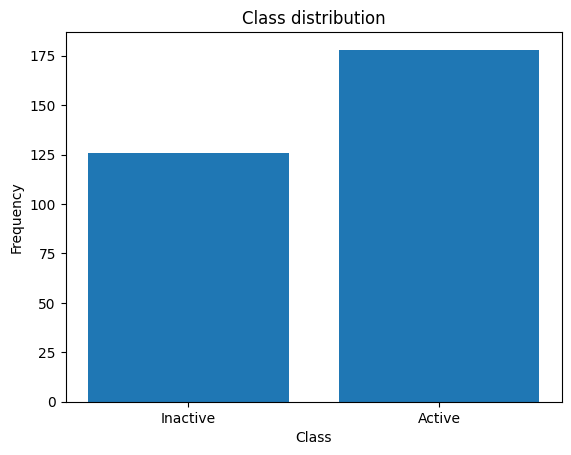

In [47]:
# plot the classes as histogram
plt.bar(['Inactive', 'Active'], [classes.count(0), classes.count(1)])
plt.title('Class distribution')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()


# Generate Mordred Descriptors as Features

We first convert the SMILES strings into RDKit molecules. RDKit is a cheminformatics software that can be used to manipulate molecules. 

In [48]:
submolecules = [Chem.MolFromSmiles(smiles) for smiles in substratesmiles]

Then we use the `Mordred` library to calculate the molecular descriptors. Mordred is a python library that can be used to calculate molecular descriptors. They include 1D, 2D and 3D descriptors. Examples of 1D descriptors are molecular weight, number of hydrogen bond donors, number of hydrogen bond acceptors, etc. Examples of 2D descriptors are number of rings, number of rotatable bonds, etc. Examples of 3D descriptors are molecular surface area, molecular volume, etc. Here we do not use 3D descriptors because they are computationally expensive to calculate.

In [49]:
calc = Calculator(descriptors, ignore_3D=True)
subfeatures_df = calc.pandas(submolecules)

100%|██████████| 304/304 [00:32<00:00,  9.39it/s]


In [50]:
subfeatures_df.head()

,ABC,ABCGG,nAcid,nBase,SpAbs_A,...,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,12.239595,10.328049,0,0,21.058346,...,18,74.0,78.0,6.083333,4.083333
1,14.666672,12.145219,0,0,23.725036,...,24,92.0,99.0,8.145833,4.583333
2,12.239595,10.328049,0,0,21.058346,...,18,74.0,78.0,6.083333,4.083333
3,12.837312,10.747326,0,0,22.380237,...,20,78.0,83.0,6.333333,4.416667
4,16.149835,13.345719,0,0,26.171815,...,28,102.0,111.0,9.256944,5.027778


`dataframe.shape` is used to get the number of rows and columns in the dataframe. The number of rows is the number of molecules in the dataset. The number of columns is the number of features in the dataset. Here, we generated 1613 Mordred descriptors for each molecule.

In [51]:
subfeatures_df.shape

(304, 1613)

`dataframe.dropna()` is used to remove rows with missing values. Here we remove rows with missing values in the target column with a threshold of 0.9 * number of rows. This means that if a row has more than 90% missing values, it will be removed. Then we also dropped the rows with a standard deviation that is less than 0.5. This is done to remove features that have little variance.

In [52]:
subfeatures_df.dropna(inplace=True, thresh=int(0.9*len(subfeatures_df.index)))
threshold = 0.5
subfeatures_df.drop(subfeatures_df.std()[subfeatures_df.std() < threshold].index.values, axis=1)
subfeatures_df.columns = [ent.strip() for ent in subfeatures_df.columns]
subfeatures_df.head()

/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_99761/2554755101.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  subfeatures_df.drop(subfeatures_df.std()[subfeatures_df.std() < threshold].index.values, axis=1)


,ABC,ABCGG,nAcid,nBase,SpAbs_A,...,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,12.239595,10.328049,0,0,21.058346,...,18,74.0,78.0,6.083333,4.083333
1,14.666672,12.145219,0,0,23.725036,...,24,92.0,99.0,8.145833,4.583333
2,12.239595,10.328049,0,0,21.058346,...,18,74.0,78.0,6.083333,4.083333
3,12.837312,10.747326,0,0,22.380237,...,20,78.0,83.0,6.333333,4.416667
4,16.149835,13.345719,0,0,26.171815,...,28,102.0,111.0,9.256944,5.027778


Then we define the types of the features. Categorial features are features that have a finite set of possible values. For example, the feature 'number of rings' can only take integer values. Continuous features are features that can take any value. For example, the feature 'molecular weight' can take any value. Here, we have both categorical and continuous features, so we choose 'some_categorical' as the type.

In [53]:
log.info(subfeatures_df)
subfeature_types = "some_categorical" # other options 'some_categorical', 'no_categorical'

           ABC      ABCGG  nAcid  nBase    SpAbs_A  ...  WPol  Zagreb1  \
0    12.239595  10.328049      0      0  21.058346  ...    18     74.0   
1    14.666672  12.145219      0      0  23.725036  ...    24     92.0   
2    12.239595  10.328049      0      0  21.058346  ...    18     74.0   
3    12.837312  10.747326      0      0  22.380237  ...    20     78.0   
4    16.149835  13.345719      0      0  26.171815  ...    28    102.0   
..         ...        ...    ...    ...        ...  ...   ...      ...   
299  28.587662  23.540835      0      0  41.758959  ...    58    200.0   
300  15.613368  12.800227      0      0  26.608945  ...    26    104.0   
301  22.100515  17.213143      0      0  34.199068  ...    42    152.0   
302  28.587662  23.540835      0      0  41.758959  ...    58    200.0   
303  28.587662  23.540835      0      0  41.758959  ...    58    200.0   

     Zagreb2   mZagreb1  mZagreb2  
0       78.0   6.083333  4.083333  
1       99.0   8.145833  4.583333  
2  

`dataframe.to_csv()` is used to save the dataframe to a csv file. This is done to save the dataframe for future use to avoid repeating the above steps.

In [54]:
subfeatures_df.to_csv("features.csv")

Now we add the class labels to the dataframe.

In [55]:
class_targets_df = pd.DataFrame(np.array([classes]).T, columns=["classes"])
features_and_classes_df = subfeatures_df.copy()
features_and_classes_df["classes"] = classes

# Pearson correlation coefficent and Spearman's rank correlation coefficient
In the next cells we can investigate how well each bit correlates against our property of interest and checks for signficance using a one tail permutation test: how many times out of the n_sample do I obtain a correlation coefficient that is greater than the observed value.

In the next block the feature with a reasonable correlation and statistically significant are chosen. The sig_metric is the significance testing metric correlation coefficent names are two tail p tests. to do one tail enter replacing option with gt for greater than and lt for less than and the correction coefficent name one of pearsron, spearman or kendalltau, onetail_$option_$correlation_coefficent.

In [56]:
subreasonable_predicted_properties, subsignificant_fearures = cwf.find_correlating_features(subfeatures_df, classes, thresh=0.2, 
                                                                                      plot=False, corr_method="spearman", 
                                                                                      sig_metric="spearman", process_non_numeric=True, 
                                                                                      sig_level=0.05, significance=True, n_sample=5000)

[1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0]
Significance will be calculated for the correlations


nBase: 0.3215 P: 0.0002 Significant at 0.0500 level? True
nF: 0.2079 P: 0.0012 Significant at 0.0500 level? True
nX: 0.2279 P: 0.0002 Significant at 0.0500 level? True
AATS1se: 0.2131 P: 0.0002 Significant at 0.0500 level? True
AATS2se: 0.2002 P: 0.0004 Significant at 0.0500 level? True
AATS1pe: 0.2066 P: 0.0004 Significant at 0.0500 level? True
AATS1are: 0.2170 P: 0.0002 Significant at 0.0500 level? True
AATS3are: 0.2000 P: 0.0004 Significant at 0.0500 level? True
AATS0i: 0.2468 P: 0.0002 Significant at 0.0500 level? True
AATS1i: 0.2564 P: 0.0002 Significant at 0.0500 level? True
AATS2i: 0.2170 P: 0.0004 Significant at 0.0500 level? True
AATS8i: 0.2263 P: 0.0002 Significant at 0.0500 level? True
ATSC0c: 0.2557 P: 0.0002 Significant at 0.0500 level? True
ATSC3c: 0.2700 P: 0.0002 Significant at 0.0500 level? True
ATSC4c: -0.3180 P: 0.0002 Significant at 0.0500 level? True
ATSC3s: 0.2093 P: 0.0006 Significant at 0.0500 level? True
ATSC0se: 0.2072 P: 0.0004 Significant at 0.0500 level? Tr

In [57]:
log.info("{} {}".format(len(subreasonable_predicted_properties), subreasonable_predicted_properties))
log.info("{} {}".format(len(subsignificant_fearures), subsignificant_fearures))
use_significant = True
use_reasonable = False

128 ['nBase', 'nF', 'nX', 'AATS1se', 'AATS2se', 'AATS1pe', 'AATS1are', 'AATS3are', 'AATS0i', 'AATS1i', 'AATS2i', 'AATS8i', 'ATSC0c', 'ATSC3c', 'ATSC4c', 'ATSC3s', 'ATSC0se', 'ATSC0pe', 'ATSC0are', 'ATSC6are', 'ATSC0i', 'ATSC1i', 'ATSC6i', 'AATSC0c', 'AATSC2c', 'AATSC3c', 'AATSC4c', 'AATSC3s', 'AATSC0v', 'AATSC6se', 'AATSC6pe', 'AATSC6are', 'AATSC1i', 'AATSC6i', 'MATS1c', 'MATS2c', 'MATS3c', 'MATS4c', 'MATS6s', 'MATS3se', 'MATS6se', 'MATS6pe', 'MATS3are', 'MATS6are', 'MATS6i', 'GATS2c', 'GATS3c', 'GATS5c', 'GATS8c', 'GATS4d', 'GATS5s', 'GATS6s', 'GATS3v', 'GATS7v', 'GATS3se', 'GATS5se', 'GATS6se', 'GATS3pe', 'GATS5pe', 'GATS6pe', 'GATS3are', 'GATS5are', 'GATS6are', 'GATS6i', 'BCUTc-1h', 'BCUTc-1l', 'BCUTi-1h', 'BCUTi-1l', 'SM1_Dzv', 'SM1_Dzare', 'SM1_Dzp', 'SM1_Dzi', 'nBondsD', 'AXp-5d', 'AXp-4dv', 'AXp-5dv', 'AXp-6dv', 'AXp-7dv', 'Mi', 'NdsCH', 'NdssC', 'NaaaC', 'NsF', 'NaaS', 'SdsCH', 'SaaCH', 'SaaaC', 'SaaNH', 'SssO', 'SaaS', 'AETA_alpha', 'ETA_shape_p', 'ETA_psi_1', 'ETA_dPsi_A', 'P

In [58]:
subfeats_df = pd.DataFrame()

if use_significant is True:
    for k in subsignificant_fearures:
        subfeats_df[k] = subfeatures_df[k].copy()
        
elif use_reasonable is True:
    for k in subreasonable_predicted_properties:
        subfeats_df[k] = subfeatures_df[k].copy()

/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_99761/2143794106.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  subfeats_df[k] = subfeatures_df[k].copy()
/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_99761/2143794106.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  subfeats_df[k] = subfeatures_df[k].copy()
/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_99761/2143794106.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many t

# Feature exploration
In the section I explore the features and their relationships. 
Use these two next cells to classify the amines into 'good' and 'bad'. To visualize all of these structure set show to True.

In [59]:
pd.set_option('display.max_columns', len(subfeats_df.columns))
subfeats_df.describe()

,nBase,nF,nX,AATS1se,AATS2se,AATS1pe,AATS1are,AATS3are,AATS0i,AATS1i,AATS2i,AATS8i,ATSC0c,ATSC3c,ATSC4c,ATSC3s,ATSC0se,ATSC0pe,ATSC0are,ATSC6are,ATSC0i,ATSC1i,ATSC6i,AATSC0c,AATSC2c,AATSC3c,AATSC4c,AATSC3s,AATSC0v,AATSC6se,AATSC6pe,AATSC6are,AATSC1i,AATSC6i,MATS1c,MATS2c,MATS3c,MATS4c,MATS6s,MATS3se,MATS6se,MATS6pe,MATS3are,MATS6are,MATS6i,GATS2c,GATS3c,GATS5c,GATS8c,GATS4d,GATS5s,GATS6s,GATS3v,GATS7v,GATS3se,GATS5se,GATS6se,GATS3pe,GATS5pe,GATS6pe,GATS3are,GATS5are,GATS6are,GATS6i,BCUTc-1h,BCUTc-1l,BCUTi-1h,BCUTi-1l,SM1_Dzv,SM1_Dzare,SM1_Dzp,SM1_Dzi,nBondsD,AXp-5d,AXp-4dv,AXp-5dv,AXp-6dv,AXp-7dv,Mi,NdsCH,NdssC,NaaaC,NsF,NaaS,SdsCH,SaaCH,SaaaC,SaaNH,SssO,SaaS,AETA_alpha,ETA_shape_p,ETA_psi_1,ETA_dPsi_A,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,SMR_VSA1,EState_VSA1,EState_VSA7,VSA_EState1,VSA_EState3,MID_X,AMID_X,nARing,n5ARing,nAHRing,n5AHRing,nFRing,n9FRing,nFHRing,n9FHRing,nFaRing,n9FaRing,nFaHRing,n9FaHRing,GGI8,GGI9,JGI1,JGI2,JGI4,JGI8,JGI9,JGT10
count,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000
mean,0.200658,2.601974,2.648026,7.888347,7.994114,6.650268,6.508950,6.277447,167.217232,149.284133,156.878626,161.672910,1.073517,-0.014532,-0.252761,12.141505,5.787405,8.898301,10.025168,1.094044,130.287270,-5.819115,41.024756,0.021283,0.003455,-0.000129,-0.002163,0.097095,47.806789,0.003601,0.004859,0.007436,-0.101671,0.363829,-0.624065,0.176566,-0.023859,-0.086463,-0.001302,-0.005427,-0.029663,-0.018137,0.002377,-0.018352,0.099539,0.824169,1.054503,1.146079,0.829288,0.959563,1.105171,1.073119,1.059994,1.028658,0.884715,1.138321,1.143977,0.876781,1.083567,1.073707,0.881479,1.105641,1.093032,0.838097,0.465680,-0.387315,15.633354,10.664485,-3.131017,2.149560,-8.534159,1.980479,2.213816,0.080557,0.052578,0.028437,0.015665,0.008701,1.139263,0.378289,1.710526,1.032895,2.601974,0.217105,0.745456,12.749150,0.778999,1.377208,1.226895,0.313582,0.473980,0.149671,0.552489,0.161730,10.408973,2.754786,28.088920,3.834701,4.879368,1.188796,3.347817,17.907112,18.261409,21.856749,35.476703,10.328376,4.496120,0.121731,0.223684,0.154605,0.207237,0.154605,0.467105,0.338816,0.463816,0.338816,0.407895,0.332237,0.404605,0.332237,0.303501,0.243478,0.212392,0.069716,0.038221,0.009094,0.008099,0.444370
std,0.401153,4.233623,4.213501,0.311417,0.604534,0.366898,0.379233,0.539388,8.829752,3.427310,7.878094,6.191137,0.545774,0.345966,0.293735,40.143066,5.491272,7.720620,9.311242,4.973179,91.555196,10.948428,84.169889,0.007770,0.004459,0.003140,0.002883,0.293687,6.097572,0.021246,0.030303,0.037664,0.173621,0.627064,0.170683,0.192914,0.141482,0.114529,0.135560,0.106364,0.155290,0.147795,0.099

The next cell shows counts of for each sub-structure bit how many with and how many without that sub-structure are in each class

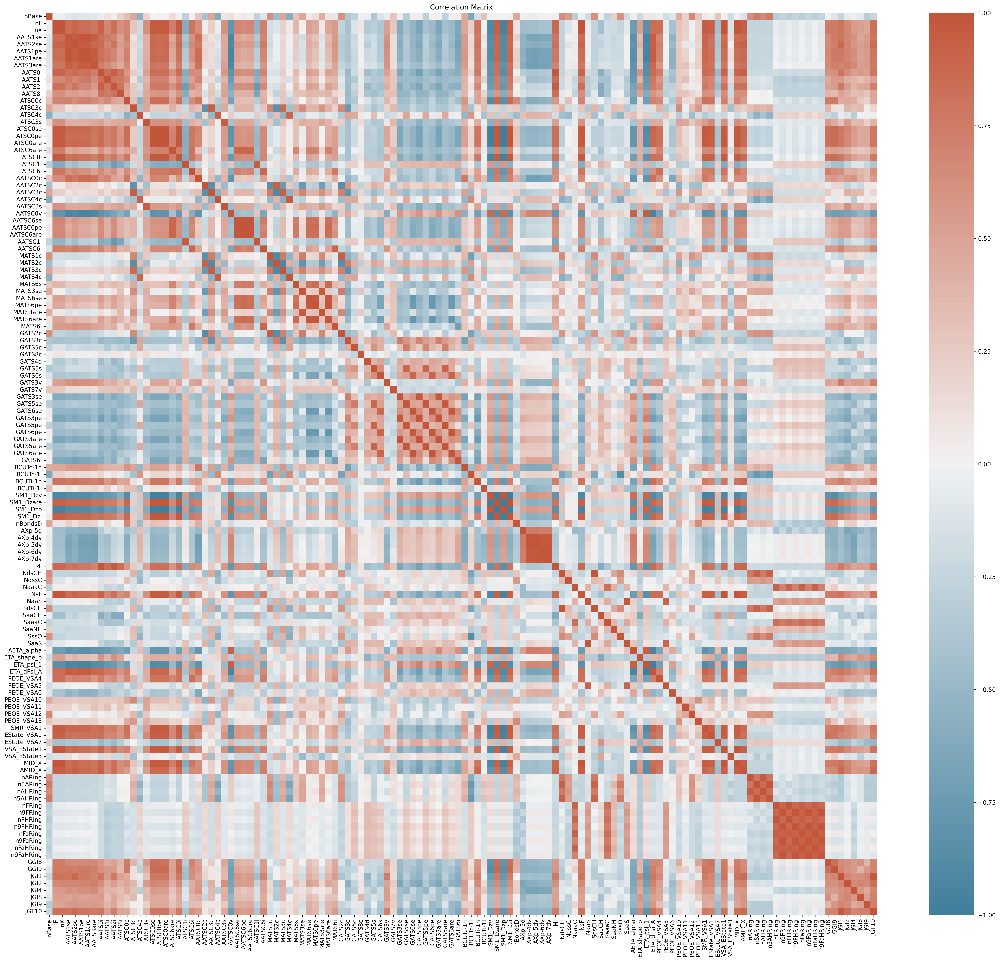

In [66]:
# plot the correlation matrix
corr_matrix = subfeats_df.corr()

# plot the correlation matrix
plt.figure(figsize=(32, 28), dpi=300)
sns.heatmap(corr_matrix, annot=False, cmap=cmap, vmin=-1, vmax=1, center=0)
plt.title("Correlation Matrix")
plt.savefig('fig_corr_matrix.png')
plt.show()


The code generates histograms of the features in the "features_df" dataframe, and separates the histograms based on the class labels in the "classes" column of the "features_and_classes_df" dataframe.

Over all classes


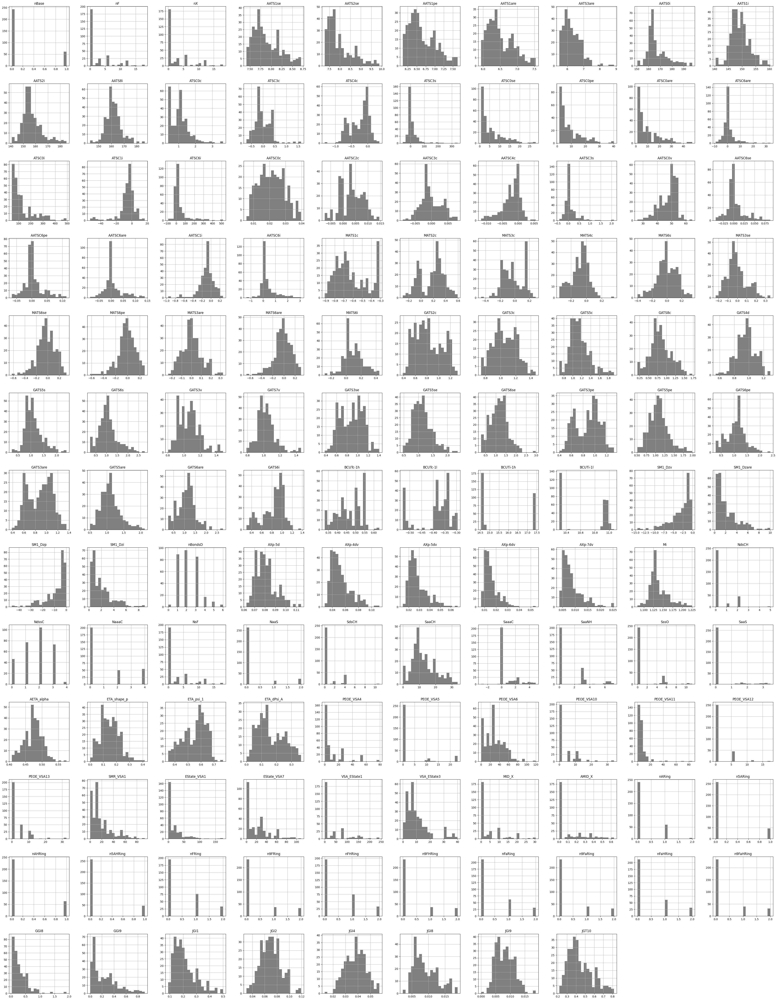

Class 0 only


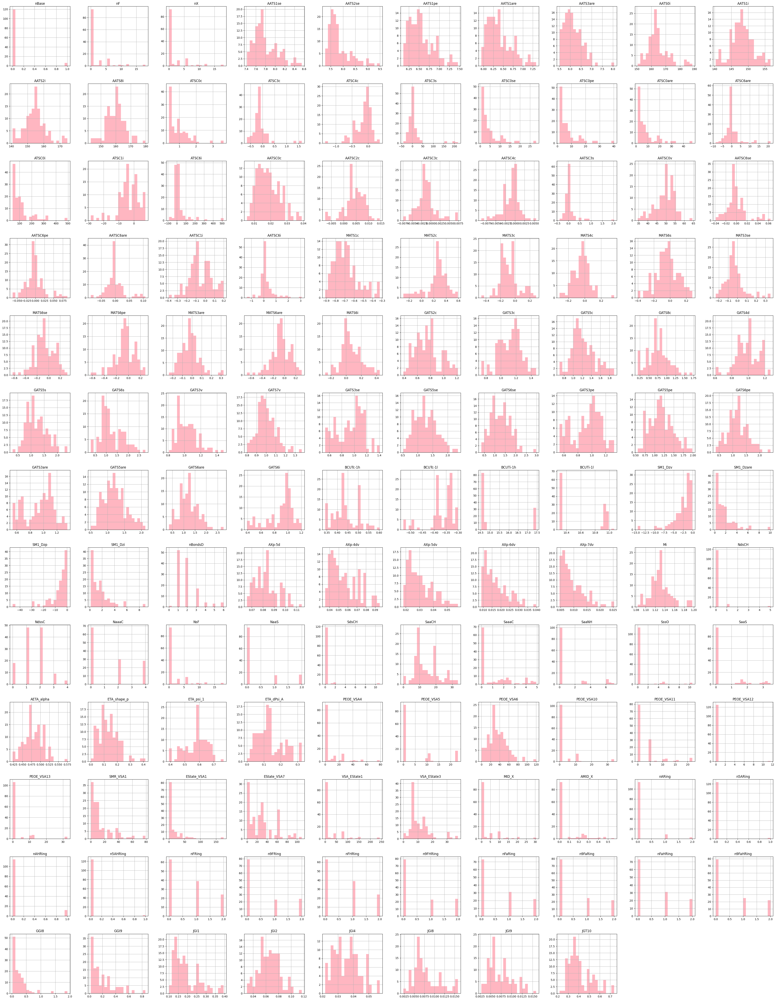

Class 1 only


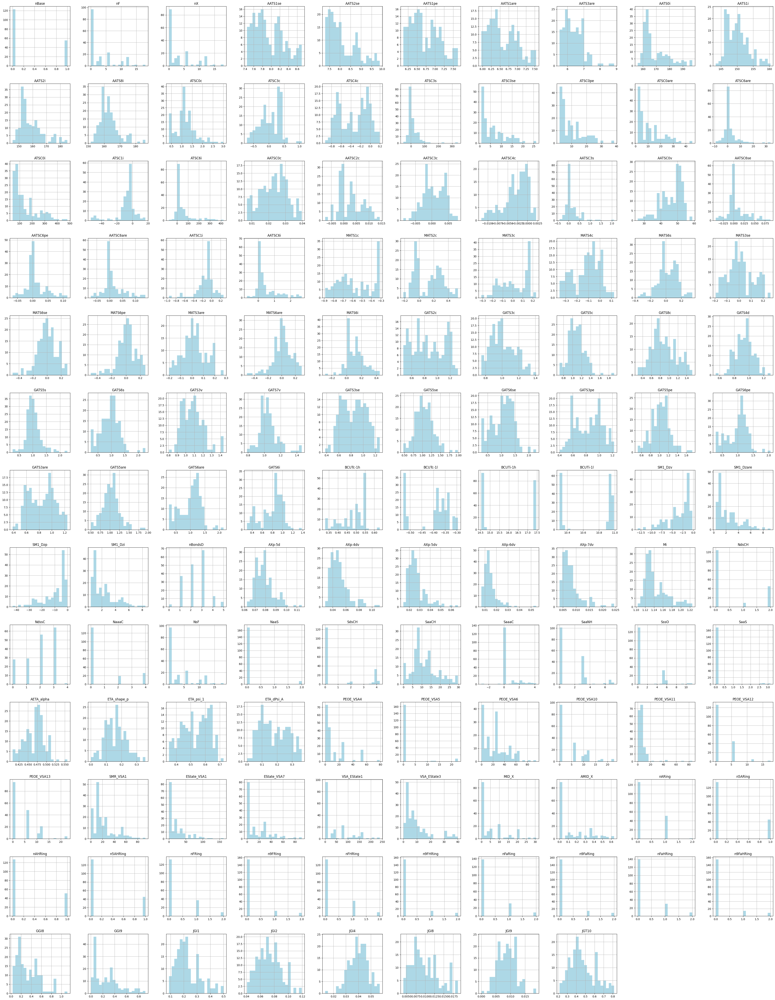

In [67]:
layout = (13,10)
figsize = (layout[1]*5,layout[0]*5)


log.info("Over all classes")
subfeats_df.hist(bins=20, figsize=figsize, color="grey", layout=layout)
plt.savefig("fig_features_all_classes.png")
plt.show()

log.info("Class 0 only")
subfeats_df[features_and_classes_df["classes"]==0].hist(bins=20, figsize=figsize, color="lightpink", layout=layout)
plt.savefig("fig_features_class_0.png")
plt.show()

log.info("Class 1 only")
subfeats_df[features_and_classes_df["classes"]==1].hist(bins=20, figsize=figsize, color="lightblue", layout=layout)
plt.savefig("fig_features_class_1.png")
plt.show()

In [68]:
# Save the features and classes to a csv file
subfeats_df["classes"] = features_and_classes_df["classes"]
subfeats_df.to_csv("features_and_classes.csv")

In [69]:
# Save the features to a csv file
features_df = subfeats_df.drop(["classes"], axis=1)
features_df.to_csv("features.csv")

# Classification
In this section we test out a range of classification models.

## Feature scaling

Here, the function `cwf.feature_categorization()` is used. It identifies which features are categorical and which features are continuous. It transforms the continuous features into one-hot encoded features. This essentially converts the continuous features into categorical features. It also scales the features to makes sure that the features are on the same scale. This is important because some machine learning algorithms are sensitive to the scale of the features. For example, the k-nearest neighbors algorithm is sensitive to the scale of the features. If the features are not scaled, the features with larger values will dominate the distance calculation.


In [70]:
help(cwf.feature_categorization)

Help on function feature_categorization in module pythia.workflow_functions:

feature_categorization(features_df, feature_types='some_categorical', categorical_indxs=None)
    function to determine the type of scaling for the features
    
    :param features_df: dataframe of original features
    :param feature_types: are they all categorical, some categorical or non categorical features
    :param categorical_indxs: indices of the categorial features. We sugguest the user provide the indices for the categorial features when feature_types="some_categorial". If not provided, the function will try to guess the categorial features automatically.
    :return: new dataframe with scaled and one-hotencoded features



In [71]:
features_df_scaled, categorical_indxs = cwf.feature_categorization(features_df, feature_types = "some_categorical")

-----
Categorical features not provided. Trying to guess the categorical features automatically.
-----
Automatically assigned categorical indices:
[0, 1, 2, 72, 79, 80, 81, 82, 83, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119] 21
Automatically assigned categorical features:
['nBase', 'nF', 'nX', 'nBondsD', 'NdsCH', 'NdssC', 'NaaaC', 'NsF', 'NaaS', 'nARing', 'n5ARing', 'nAHRing', 'n5AHRing', 'nFRing', 'n9FRing', 'nFHRing', 'n9FHRing', 'nFaRing', 'n9FaRing', 'nFaHRing', 'n9FaHRing'] 21
**Please check if the automatic assignment is correct. If not, please provide the indices of the categorical features.**
-----
Numerical features:
['AATS1se', 'AATS2se', 'AATS1pe', 'AATS1are', 'AATS3are', 'AATS0i', 'AATS1i', 'AATS2i', 'AATS8i', 'ATSC0c', 'ATSC3c', 'ATSC4c', 'ATSC3s', 'ATSC0se', 'ATSC0pe', 'ATSC0are', 'ATSC6are', 'ATSC0i', 'ATSC1i', 'ATSC6i', 'AATSC0c', 'AATSC2c', 'AATSC3c', 'AATSC4c', 'AATSC3s', 'AATSC0v', 'AATSC6se', 'AATSC6pe', 'AATSC6are', 'AATSC1i', 'AATSC6i', 'MATS1c', '

Index(['AATS1se', 'AATS2se', 'AATS1pe', 'AATS1are', 'AATS3are', 'AATS0i',
       'AATS1i', 'AATS2i', 'AATS8i', 'ATSC0c',
       ...
       'nFaRing_2', 'n9FaRing_0', 'n9FaRing_1', 'n9FaRing_2', 'nFaHRing_0',
       'nFaHRing_1', 'nFaHRing_2', 'n9FaHRing_0', 'n9FaHRing_1',
       'n9FaHRing_2'],
      dtype='object', length=203)
      AATS1se   AATS2se   AATS1pe  AATS1are  AATS3are  ...  nFaHRing_1  \
0    0.120128  0.063643  0.098016  0.094666  0.044727  ...         0.0   
1    0.298224  0.250473  0.277538  0.285835  0.128346  ...         0.0   
2    0.135297  0.072177  0.107358  0.098593  0.047718  ...         0.0   
3    0.118053  0.056069  0.105949  0.111313  0.050916  ...         0.0   
4    0.335636  0.270767  0.313039  0.319582  0.187022  ...         0.0   
..        ...       ...       ...       ...       ...  ...         ...   
299  0.036265  0.019781  0.035271  0.040611  0.120240  ...         0.0   
300  0.172704  0.116648  0.191036  0.172084  0.147702  ...         0.0   
301 

After the step above, the features are all categorical. Thus, we update the feature types to 'categorical' using the cell below.

In [72]:
feature_types = "categorical"

The cell below make a copy of the scaled features and classes dataframe. This is done to avoid making unwanted changes to the original dataframe in the next steps and then have to rerun the cells above.

In [73]:
features_df = features_df_scaled.copy()

## Add in experimental / custom features (optional)

For this example, we will add in some custom features in addition to the Mordred descriptors. These features are:
- Experimental features from the ISE Cl-/NO3- assay: concentration of the chloride ions in the external medium, and time between transporter addition and vesicle lysis.
- Substructure presence: one-hot encoded for the presence (1) or absence (0) of common binding motifs. This one-hot encoding was done in **Notebook 1 - Dataset Analysis**.

In [74]:
feats_to_add = ['cl_conc_(mm)', 'time_between_transporter_added_and_lysis_(s)']

substructure_name_list = ['thiourea',
                     'urea', 
                     'squaramide', 
                     'indole', 
                     'tambjamine', 
                     'carbazole', 
                     'acridinone', 
                     'perenosin',
                     'bisbzimpy', 
                     'isophthalamides_dipicolineamides']

for f in feats_to_add:
    features_df[f] = data[f]

for f in substructure_name_list:
    features_df[f] = data[f]

# change column name "time_between_transporter_added_and_lysis_(s)" to  "$\Delta t$"
# change column name "cl_conc_(mm)" to "[Cl$^{-}]$"
features_df = features_df.rename(columns={"time_between_transporter_added_and_lysis_(s)": "$\Delta t$", "cl_conc_(mm)": "[Cl$^{-}]$"})

features_df

,AATS1se,AATS2se,AATS1pe,AATS1are,AATS3are,...,carbazole,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides
0,0.120128,0.063643,0.098016,0.094666,0.044727,...,0,0,0,0,0
1,0.298224,0.250473,0.277538,0.285835,0.128346,...,0,0,0,0,0
2,0.135297,0.072177,0.107358,0.098593,0.047718,...,0,0,0,0,0
3,0.118053,0.056069,0.105949,0.111313,0.050916,...,0,0,0,0,0
4,0.335636,0.270767,0.313039,0.319582,0.187022,...,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
299,0.036265,0.019781,0.035271,0.040611,0.120240,...,0,0,0,0,0
300,0.172704,0.116648,0.191036,0.172084,0.147702,...,0,0,0,0,0
301,0.578982,0.550713,0.591048,0.575661,0.363485,...,0,0,0,0,0
302,0.879275,0.847704,0.886709,0.873957,0.521726,...,0,0,0,0,0


## Using synthetic data sampling

In this section I investigate the use of synthetic sampling methods, i.e. generate additional sampling points for the minority class or undersample the majority class. Both of these techniques look to provide a better balance between the classes and hence improve the learning of a decision boundary. SMOTE https://arxiv.org/pdf/1106.1813.pdf.


In [75]:
nneighbours = min(5, len(class_targets_df[class_targets_df["classes"]==1].index)-1)
log.info("Number of neighbours used for SMOTE: {}".format(nneighbours))

# feature_types is set when the fingerprints are calculated
# No catagorical
if feature_types == "no_categorical":
    sm = SMOTE(sampling_strategy="not majority", random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)
# Some catagorical - Need to provide the indexes
elif feature_types == "some_categorical":
    sm = SMOTENC(sampling_strategy="not majority", categorical_features=categorical_indxs, random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)
# All catagorical
elif feature_types == "categorical":
    sm = SMOTEN(sampling_strategy="not majority", random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)

Number of neighbours used for SMOTE: 5


Check that there are only features in the feature dataframe and classes in the classes dataframe.

In [76]:
log.info("Feature decriptions:\n{}".format(features_df.columns.values))
log.info("Classes/Targets descriptions:\n{}".format(class_targets_df.columns.values))

Feature decriptions:
['AATS1se' 'AATS2se' 'AATS1pe' 'AATS1are' 'AATS3are' 'AATS0i' 'AATS1i'
 'AATS2i' 'AATS8i' 'ATSC0c' 'ATSC3c' 'ATSC4c' 'ATSC3s' 'ATSC0se' 'ATSC0pe'
 'ATSC0are' 'ATSC6are' 'ATSC0i' 'ATSC1i' 'ATSC6i' 'AATSC0c' 'AATSC2c'
 'AATSC3c' 'AATSC4c' 'AATSC3s' 'AATSC0v' 'AATSC6se' 'AATSC6pe' 'AATSC6are'
 'AATSC1i' 'AATSC6i' 'MATS1c' 'MATS2c' 'MATS3c' 'MATS4c' 'MATS6s'
 'MATS3se' 'MATS6se' 'MATS6pe' 'MATS3are' 'MATS6are' 'MATS6i' 'GATS2c'
 'GATS3c' 'GATS5c' 'GATS8c' 'GATS4d' 'GATS5s' 'GATS6s' 'GATS3v' 'GATS7v'
 'GATS3se' 'GATS5se' 'GATS6se' 'GATS3pe' 'GATS5pe' 'GATS6pe' 'GATS3are'
 'GATS5are' 'GATS6are' 'GATS6i' 'BCUTc-1h' 'BCUTc-1l' 'BCUTi-1h'
 'BCUTi-1l' 'SM1_Dzv' 'SM1_Dzare' 'SM1_Dzp' 'SM1_Dzi' 'AXp-5d' 'AXp-4dv'
 'AXp-5dv' 'AXp-6dv' 'AXp-7dv' 'Mi' 'SdsCH' 'SaaCH' 'SaaaC' 'SaaNH' 'SssO'
 'SaaS' 'AETA_alpha' 'ETA_shape_p' 'ETA_psi_1' 'ETA_dPsi_A' 'PEOE_VSA4'
 'PEOE_VSA5' 'PEOE_VSA6' 'PEOE_VSA10' 'PEOE_VSA11' 'PEOE_VSA12'
 'PEOE_VSA13' 'SMR_VSA1' 'EState_VSA1' 'EState_VSA7' 'VSA

Sample using smote to balance the dataset using synthetic samples for the under represented class.

In [77]:
features_smote, classes_smote = sm.fit_resample(features_df.to_numpy(), class_targets_df.to_numpy())
n_sythetic_points = features_smote.shape[0] - len(features_df.index)
log.info("SMOTE has added {} sythetic features to balance the classes".format(n_sythetic_points))

/Users/allybo/opt/anaconda3/envs/pythiachem/lib/python3.9/site-packages/imblearn/over_sampling/_smote/base.py:950: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
SMOTE has added 52 sythetic features to balance the classes


In [78]:
log.info("Resampled X\n{}\n{}\nResampled y:\n{}\n{}".format(features_smote, features_smote.shape, classes_smote, classes_smote.shape))

Resampled X
[[0.12012777 0.06364277 0.09801589 ... 0.         0.         0.        ]
 [0.29822446 0.25047299 0.27753763 ... 0.         0.         0.        ]
 [0.13529726 0.07217683 0.10735765 ... 0.         0.         0.        ]
 ...
 [0.17270422 0.11664836 0.19103645 ... 0.         0.         0.        ]
 [0.14729394 0.08546055 0.12064402 ... 0.         0.         0.        ]
 [0.08134888 0.04816464 0.05506486 ... 0.         0.         0.        ]]
(356, 215)
Resampled y:
[1 1 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 0 0 1 0
 0 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 1 1
 1 1 0 0 0 0 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 0 0 1 1 1 0 0 1 1 1 0 1 1
 1 0 0 0 0 1 1 0 1 0 1 0 1 0 0 1 1 0 1 1 1 0 1 1 1 0 0 0 1 1 1 1 1 1 0 0 1
 0 1 1 1 0 0 1 0 1 0 1 0 0 1 1 1 1 1 1 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 1 1 1
 1 0 0 1 1 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1

In [79]:
features_smote_df = pd.DataFrame(data=features_smote, columns=features_df.columns.values)
classes_smote_df = pd.DataFrame(data=classes_smote, columns=["classes"])

comb_df_res = features_smote_df.copy()
comb_df_res["classes"] = classes_smote
comb_df_res.to_csv("resampled_synthetic_data_set.csv")
comb_df_res

,AATS1se,AATS2se,AATS1pe,AATS1are,AATS3are,...,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides,classes
0,0.120128,0.063643,0.098016,0.094666,0.044727,...,0.0,0.0,0.0,0.0,1
1,0.298224,0.250473,0.277538,0.285835,0.128346,...,0.0,0.0,0.0,0.0,1
2,0.135297,0.072177,0.107358,0.098593,0.047718,...,0.0,0.0,0.0,0.0,0
3,0.118053,0.056069,0.105949,0.111313,0.050916,...,0.0,0.0,0.0,0.0,1
4,0.335636,0.270767,0.313039,0.319582,0.187022,...,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...
351,0.243220,0.168390,0.239562,0.211080,0.122881,...,0.0,0.0,0.0,0.0,0
352,0.203035,0.139532,0.239562,0.211080,0.143296,...,0.0,0.0,0.0,0.0,0
353,0.172704,0.116648,0.191036,0.172084,0.142857,...,0.0,0.0,0.0,0.0,0
354,0.147294,0.085461,0.120644,0.120134,0.068445,...,0.0,0.0,0.0,0.0,0


## Using balanced classes Kfold
This section tests the relience of the model on the training set. 

First, we define the different classifiers we want to try.

In [80]:
kfold_clf_names = [
    "Nearest Neighbors", 
    "Gaussian Process",
    "Decision Tree", 
    "ExtraTreesClassifier", 
    "AdaBoost",
    "Logistic Regression"]


kfold_classifiers = [
    KNeighborsClassifier(),
    GaussianProcessClassifier(random_state=random_seed, n_jobs=-1),
    DecisionTreeClassifier(random_state=random_seed),
    ExtraTreesClassifier(random_state=random_seed, n_jobs=-1),
    AdaBoostClassifier(random_state=random_seed),
    LogisticRegression(random_state=random_seed, n_jobs=-1, solver="lbfgs")]

kfold_classifier_parameters = {
    "Nearest Neighbors": {"n_neighbors": [ent for ent in range(2, 10, 1)]},
    "Gaussian Process": {"kernel":[1.0 * Matern(length_scale=1.0, nu=1.5), 1.0 * Matern(length_scale=1.0, nu=2.5), 1.0 * RBF(1.0),  1.0 * RBF(1.0) + WhiteKernel(noise_level=0.5)]},
    "Decision Tree": {"max_depth": [2, 3, 4, 5, 7, 10]},
    "ExtraTreesClassifier": {"max_depth": [2, 3, 4, 5, 7, 10], "n_estimators": [10, 20, 50, 100]},
    "AdaBoost": {"n_estimators": [10, 20, 50, 100]},
    "Logistic Regression": {"penalty":["l2"], "C": [0.05, 0.1, 0.25, 0.5, 1.0, 1.25]}
}

In [81]:
cwf.kfold_test_classifiers_with_optimization(features_smote_df, classes_smote_df, kfold_classifiers, kfold_classifier_parameters, 
                                                        overwrite=True, scale=True, cv=5, n_repeats=10, smiles=None, names=None,
                                                        random_seed=random_seed, clf_names=kfold_clf_names, class_labels=(0,1))

Features: Index(['AATS1se', 'AATS2se', 'AATS1pe', 'AATS1are', 'AATS3are', 'AATS0i',
       'AATS1i', 'AATS2i', 'AATS8i', 'ATSC0c',
       ...
       'thiourea', 'urea', 'squaramide', 'indole', 'tambjamine', 'carbazole',
       'acridinone', 'perenosin', 'bisbzimpy',
       'isophthalamides_dipicolineamides'],
      dtype='object', length=215)
Features:       AATS1se   AATS2se   AATS1pe  AATS1are  AATS3are    AATS0i    AATS1i  \
0    0.120128  0.063643  0.098016  0.094666  0.044727  0.245134  0.340220   
1    0.298224  0.250473  0.277538  0.285835  0.128346  0.471922  0.521061   
2    0.135297  0.072177  0.107358  0.098593  0.047718  0.262187  0.358288   
3    0.118053  0.056069  0.105949  0.111313  0.050916  0.266309  0.354123   
4    0.335636  0.270767  0.313039  0.319582  0.187022  0.454729  0.494945   
..        ...       ...       ...       ...       ...       ...       ...   
351  0.243220  0.168390  0.239562  0.211080  0.122881  0.049331  0.049641   
352  0.203035  0.139532  0.23

	Train indx [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  20
  21  22  23  24  25  27  28  29  30  31  32  33  34  35  36  37  38  40
  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58
  59  60  61  62  64  65  66  67  68  69  70  71  72  73  74  75  76  77
  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  96
  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114
 115 116 118 119 120 121 122 124 125 126 127 128 130 131 132 133 134 135
 136 137 139 140 143 144 145 146 147 148 149 151 153 154 155 156 157 158
 159 160 161 162 163 164 165 166 167 168 169 170 171 173 174 175 176 177
 178 179 180 181 183 184 185 186 187 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 207 208 210 211 212 213 214 215 216 218 219
 220 221 222 223 224 225 226 227 228 229 230 231 232 233 235 236 237 238
 240 241 242 243 247 248 249 250 251 252 253 254 255 256 257 258 259 260
 261 262 263 264 265 266 267 268 269 27

In [82]:
directory_names = cwf.directory_names(kfold_clf_names)

In [83]:
directory_names

['Nearest_Neighbors',
 'Gaussian_Process',
 'Decision_Tree',
 'ExtraTreesClassifier',
 'AdaBoost',
 'Logistic_Regression']

## Analyses the output over all folds and predictions therefore for all molecules
The next cell reads in the predictions from each fold (n_repeats max_folds should = n_repeats).


Nearest_Neighbors
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to fig_CV_nearest_neighbors_morderd.png
['fig_CV_nearest_neighbors_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 143, 'fp': 35, 'fn': 42, 'tp': 136}
[[143  35]
 [ 42 136]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report

Gaussian_Process
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to fig_CV_gaussian_process_morderd.png
['fig_CV_nearest_neighbors_morderd.png', 'fig_CV_gaussian_process_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 159, 'fp': 19, 'fn': 24, 'tp': 154}
[[159  19]
 [ 24 154]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_99761/2082819622.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_for_paper = df_metrics_for_paper.append(pd.Series(metrics_for_paper, name=kfold_clf_names[ith].lower()))

Decision_Tree
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to fig_CV_decision_tree_morderd.png
['fig_CV_nearest_neighbors_morderd.png', 'fig_CV_gaussian_process_morderd.png', 'fig_CV_decision_tree_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 126, 'fp': 52, 'fn': 26, 'tp': 152}
[[126  52]
 [ 26 152]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_99761/2082819622.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_for_paper = df_metrics_for_paper.append(pd.Series(metrics_for_paper, name=kfold_clf_names[ith].lower()))

ExtraTreesClassifier
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to fig_CV_extratreesclassifier_morderd.png
['fig_CV_nearest_neighbors_morderd.png', 'fig_CV_gaussian_process_morderd.png', 'fig_CV_decision_tree_morderd.png', 'fig_CV_extratreesclassifier_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 148, 'fp': 30, 'fn': 32, 'tp': 146}
[[148  30]
 [ 32 146]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_99761/2082819622.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_for_paper = df_metrics_for_paper.append(pd.Series(metrics_for_paper, name=kfold_clf_names[ith].lower()))

AdaBoost
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to fig_CV_adaboost_morderd.png
['fig_CV_nearest_neighbors_morderd.png', 'fig_CV_gaussian_process_morderd.png', 'fig_CV_decision_tree_morderd.png', 'fig_CV_extratreesclassifier_morderd.png', 'fig_CV_adaboost_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 141, 'fp': 37, 'fn': 30, 'tp': 148}
[[141  37]
 [ 30 148]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_99761/2082819622.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_for_paper = df_metrics_for_paper.append(pd.Series(metrics_for_paper, name=kfold_clf_names[ith].lower()))

Logistic_Regression
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to fig_CV_logistic_regression_morderd.png
['fig_CV_nearest_neighbors_morderd.png', 'fig_CV_gaussian_process_morderd.png', 'fig_CV_decision_tree_morderd.png', 'fig_CV_extratreesclassifier_morderd.png', 'fig_CV_adaboost_morderd.png', 'fig_CV_logistic_regression_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 148, 'fp': 30, 'fn': 46, 'tp': 132}
[[148  30]
 [ 46 132]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_99761/2082819622.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_for_paper = df_metrics_for_paper.append(pd.Series(metrics_for_paper, name=kfold_clf_names[ith].lower()))
/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_99761/2082819622.py:42: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  df_metrics_for_paper.to_latex(fout, float_format="{:0.2f}".format, position="H", caption=cap, label="tbl:mordred_features")
/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_99761/2082819622.py:43: FutureWarning: 

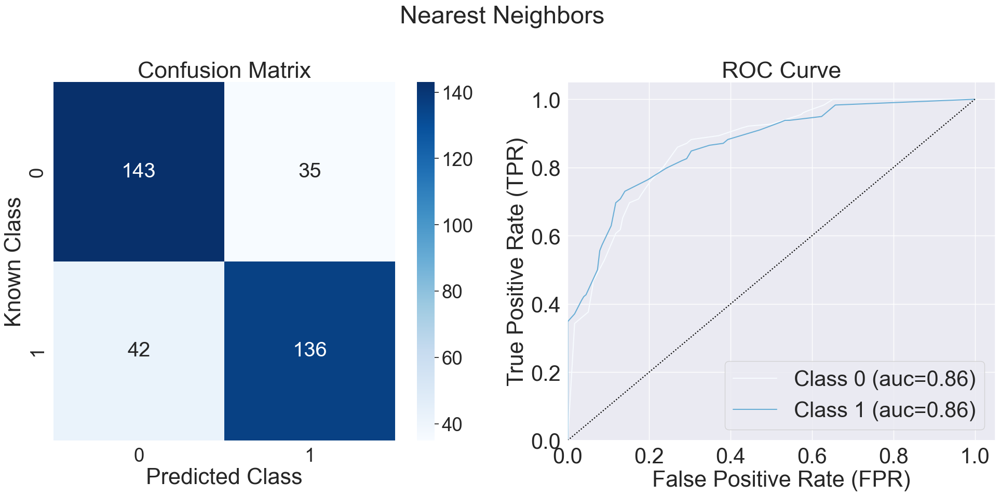

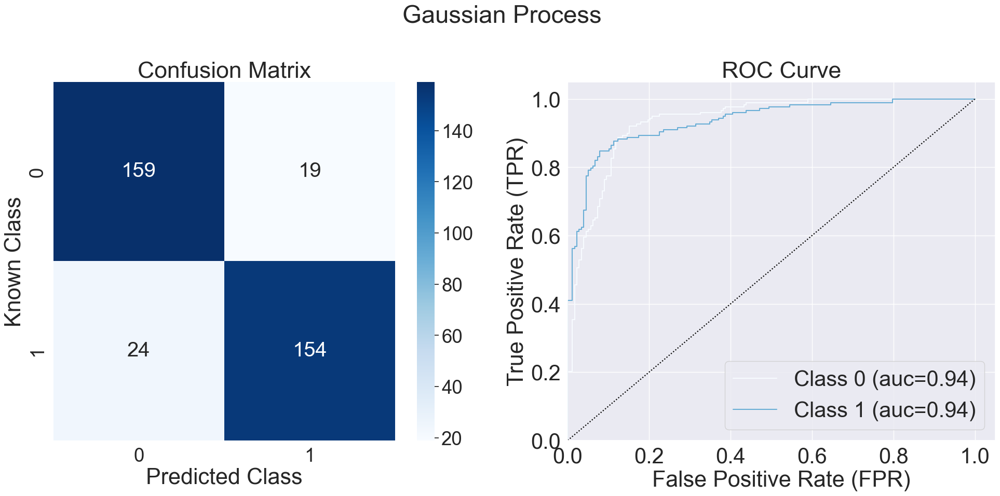

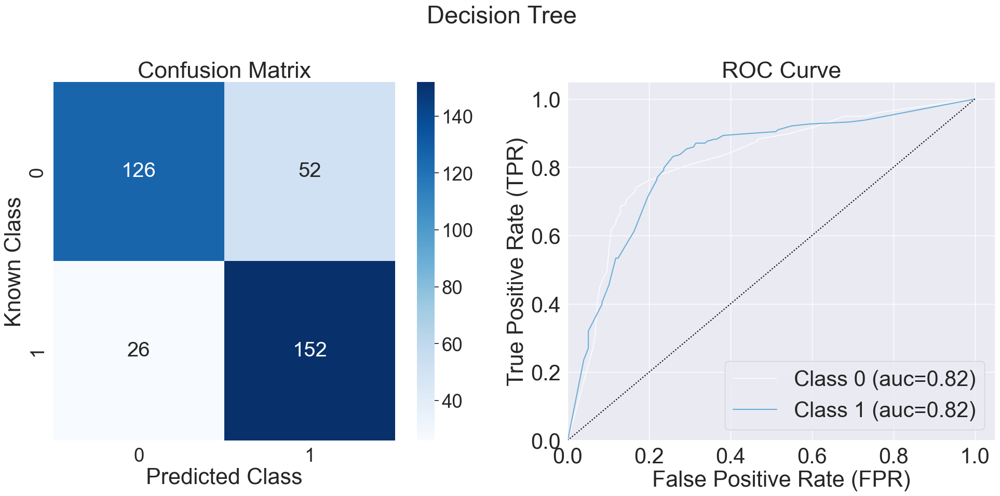

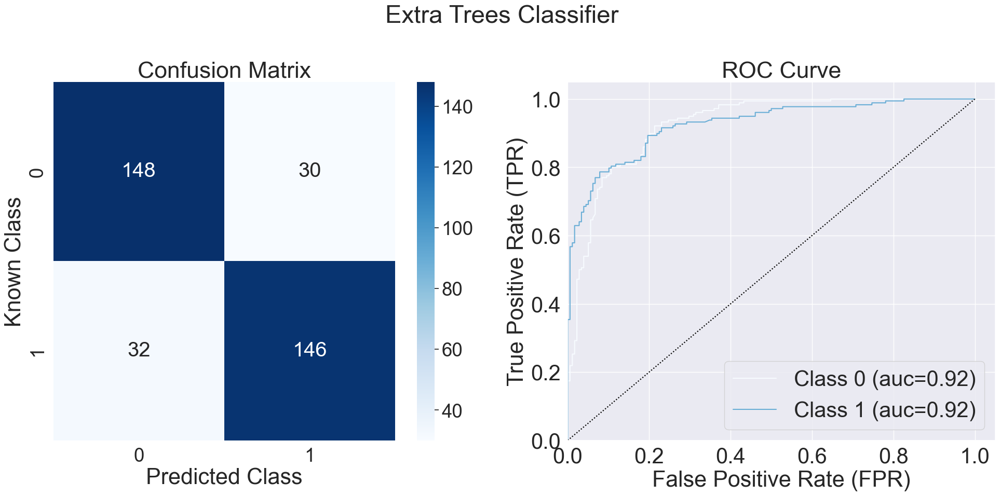

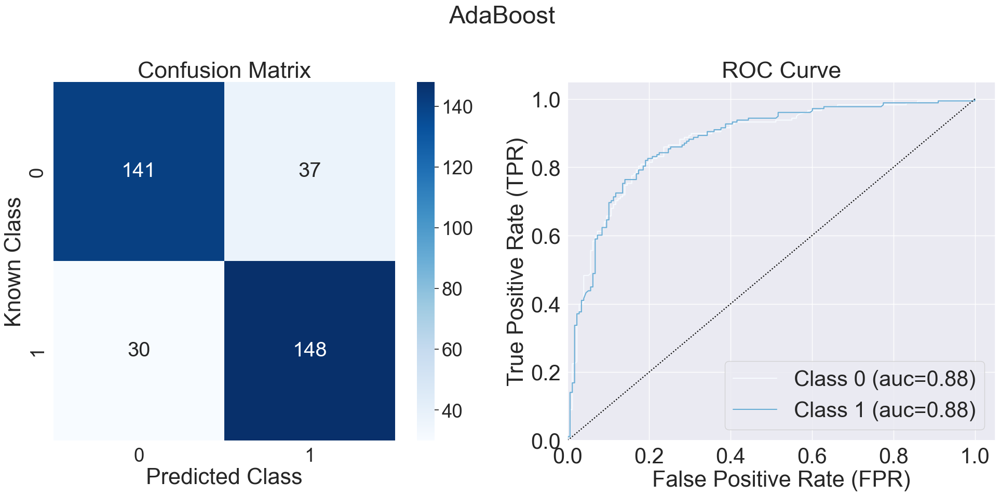

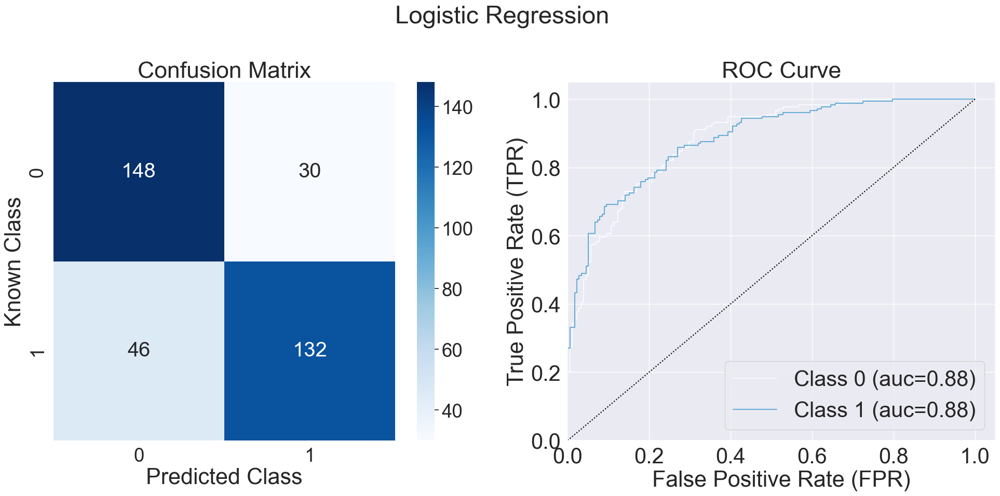

In [86]:
files_plt = []

kfold_clf_names = ["Nearest Neighbors", "Gaussian Process",
         "Decision Tree", "Extra Trees Classifier", "AdaBoost",
         "Logistic Regression"]

for ith, dirname in enumerate(directory_names):
    log.info("\n{}\n-------------\n".format(dirname))
    data = cwf.build_data_from_directory(dirname, max_folds=10)
    
    probs = data[["prob0", "prob1"]].to_numpy()
    log.debug("Probablities for a few examples {}".format(probs[0:3,0:2]))
    
    cm = cmetrics.get_confusion_matrix(data, predicted_column_name="prediction", known_column_name="known", return_dict=False)
    log.debug("Confusion matrix for {}\n{}".format(dirname, cm))
    
    plt_name = "fig_CV_{}_morderd.png".format("_".join([ent.lower() for ent in dirname.split()]))
    files_plt.append(plt_name)
    log.info("Saving plot to {}\n{}".format(plt_name, files_plt))
    metrics = cmetrics.calculate_confusion_based_metrics(df=data, probabilities=probs, col_map="Blues", positive_label=1, 
                                                         plt_filename=plt_name, all_classes=False, get_roc_curve=True, 
                                                         get_pr_curve=False, annotate=True, vmin=0, vmax=85,
                                                         title="{}".format(kfold_clf_names[ith]))
    
    metrics_for_paper = {
    "Accuracy": metrics["accuracy"].round(2),
    "Sensitivity": metrics["tpr"].round(2),
    "Specificity": metrics["tnr"].round(2),
    "MCC": metrics["matthews_correlation_coefficient"].round(2),
    "Precision": metrics["precision"].round(2),
    "G-mean": metrics["g-mean"].round(2),
    }
    
    if ith == 0:
        df_metrics_for_paper = pd.DataFrame(data=metrics_for_paper, index=[kfold_clf_names[ith].lower()])
    else:
        df_metrics_for_paper = df_metrics_for_paper.append(pd.Series(metrics_for_paper, name=kfold_clf_names[ith].lower()))
    log.debug(df_metrics_for_paper)

with open("metrics_mordred.tex", "w") as fout:
    cap = "Classifier metrics for balanced data with models built from mordred features. MCC is the Matthew’s correlation coefficent."
    df_metrics_for_paper.to_latex(fout, float_format="{:0.2f}".format, position="H", caption=cap, label="tbl:mordred_features")
log.info(df_metrics_for_paper.to_latex())

In [87]:
images = [Image.open(x) for x in files_plt]
log.info("Combining {} images".format(len(images)))
widths, heights = zip(*(i.size for i in images))
log.info("{}".format("\n".join("W: {} H: {}".format(wid, hgt) for wid, hgt in zip(widths, heights))))
total_height = sum(heights)
total_width = max(widths)

log.info("New image will be W:{} H:{}".format(total_width, total_height))

combined_image = Image.new("RGBA", (total_width, total_height))
y_offset = 0
for ith, img in enumerate(images):
    log.info("Image {} added at offset height {}".format(ith, y_offset))
    combined_image.paste(img, (0, y_offset))
    y_offset = y_offset + img.size[1]

combined_image.save("combined_mordred_CV.png")

Combining 6 images
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
New image will be W:6000 H:18000


Image 0 added at offset height 0
Image 1 added at offset height 3000
Image 2 added at offset height 6000
Image 3 added at offset height 9000
Image 4 added at offset height 12000
Image 5 added at offset height 15000


# Machine Learning

In this section, we implement a train-test split strategy. The models are trained on the training set and then evaluated on the test set.

## Load data

In [189]:
data = pd.read_csv("../Notebook-dataset-analysis/df_all_substructure_onehot.csv")
data.columns = ["_".join(ent.lower().strip().split(" ")) for ent in data.columns]

In [190]:
data['logec50'] = data['target'].fillna('N')

classes = data["class"].tolist()
log.info("class: {}".format(classes))
log.info("class 1 count: {}".format(classes.count(1)))
log.info("class 0 count: {}".format(classes.count(0)))

class: [1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0]
class 1 count: 178


class 0 count: 126


##  Train-test split

We split the dataset into a training and test set by temporal split. The training set contains all compounds up to 2020, while the test set contains all compounds after 2020.

In [191]:
log.info("Number of years in the dataset: " + str(len(data["year"].unique())))
log.info("Years in the dataset are: " + str(data["year"].sort_values().unique()))
log.info("Number of compounds per year: " + str(data.groupby("year").size().tolist()))

Number of years in the dataset: 11
Years in the dataset are: [2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
Number of compounds per year: [16, 27, 33, 41, 18, 66, 22, 7, 8, 22, 44]


In [192]:
# sort by year
data = data.sort_values(by=['year'])

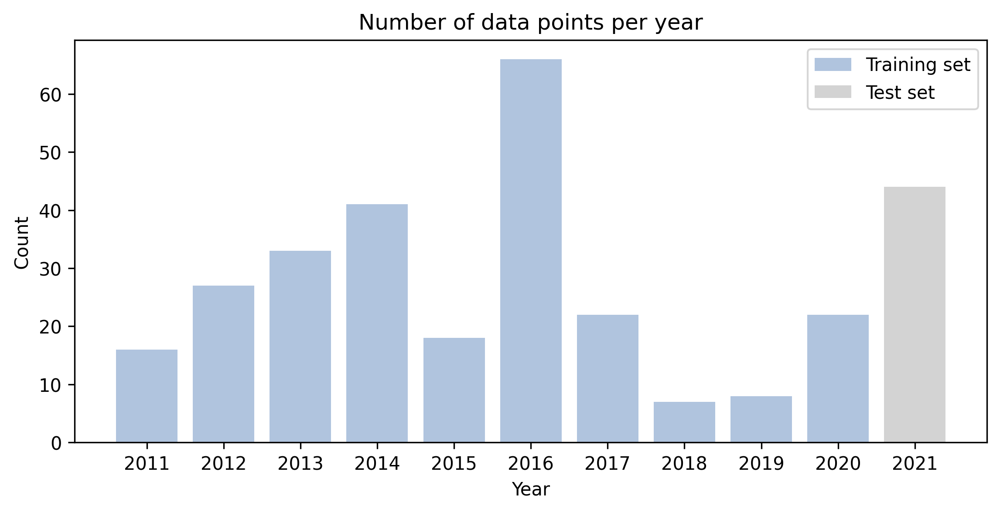

In [193]:
# plot the number of data points per year
plt.figure(figsize= (9, 4), dpi=300)

# background is white
plt.style.use('default')

plt.title('Number of data points per year')
plt.bar(data['year'].unique(), data.groupby('year').size().tolist(), color="lightsteelblue", label='Training set')
# color the last bar grey
plt.bar(data['year'].unique()[-1], data.groupby('year').size().tolist()[-1], color="lightgrey", label='Test set')
plt.xlabel('Year')
plt.ylabel('Count')
plt.xticks(data['year'].unique())
plt.legend()
plt.savefig('fig_year_count.png', dpi=300)
plt.show()

In [194]:
# split dataset by year
# select the IDs of the test data (2021)

test_dataid = []
for year in data['year'].unique():
    if year == 2021:
        test_dataid.append(data[data['year'] == year].index.tolist())
test_dataid = [item for sublist in test_dataid for item in sublist]

log.info('Number of test data: {}'.format(len(test_dataid)))
log.info('Test data IDs: {}'.format(test_dataid))

Number of test data: 44
Test data IDs: [93, 91, 92, 90, 89, 125, 126, 127, 94, 83, 96, 97, 98, 128, 99, 100, 101, 102, 103, 95, 129, 140, 131, 84, 85, 86, 87, 105, 88, 144, 143, 142, 141, 82, 139, 138, 137, 136, 135, 134, 133, 132, 130, 104]


In [195]:
# create a test set dataframe
test_data = pd.DataFrame()
test_data = data.iloc[test_dataid] # get test data using test_dataid
test_data = test_data.reset_index(drop=True) # reset index

# create a train set dataframe
train_data = data.drop(index=test_dataid, axis=0, inplace = False) # drop test data by excluding test_dataid
train_data = train_data.reset_index(drop=True) # reset index

In [196]:
# define input SMILES and target values for training set
substratesmiles_train = train_data["canonical_smiles"]
log.info("Transporter SMILES: {}".format(substratesmiles_train.head()))

target_train = train_data["logec50"]
log.info("logEC50: {}".format(target_train.head()))

classes_train = train_data["class"].tolist()
log.info("Class: {}".format(target_train.head()))

Transporter SMILES: 0    CC(C)CCNC(=S)Nc1cccc2cc[nH]c12
1                CCCCNC(=O)NCCC(C)C
2                CCCCNC(=S)NCCC(C)C
3            CC(C)CCNC(=O)Nc1ccccc1
4            CC(C)CCNC(=S)Nc1ccccc1
Name: canonical_smiles, dtype: object
logEC50: 0   -1.537602
1           N
2   -0.962574
3           N
4    0.483872
Name: logec50, dtype: object
Class: 0   -1.537602
1           N
2   -0.962574
3           N
4    0.483872
Name: logec50, dtype: object


In [197]:
# define input SMILES and target values for test set
substratesmiles_test = test_data["canonical_smiles"]
log.info("Transporter SMILES: {}".format(substratesmiles_test.head()))

target_test = test_data["logec50"]
log.info("logEC50: {}".format(target_test.head()))

classes_test = test_data["class"].tolist()
log.info("Class: {}".format(target_test.head()))

Transporter SMILES: 0       CCCCCC1=C/C(=C/c2[nH]c(-c3ccc[nH]3)cc2OC)N=C1C
1    O=C(Nc1cc(C(F)(F)F)cc(C(F)(F)F)c1)Nc1cc(F)c(F)...
2                       CCCCCCNC(=S)NC(=O)c1ccc(OC)cc1
3    O=C(Nc1ccc([N+](=O)[O-])cc1)Nc1ccccc1NC(=O)Nc1...
4    N#Cc1ccc(NC(=O)NCc2cccc(/N=N\c3cccc(CNC(=O)Nc4...
Name: canonical_smiles, dtype: object
logEC50: 0    -3.19382
1    -2.79588
2   -0.552842
3   -2.318759
4   -0.420216
Name: logec50, dtype: object
Class: 0    -3.19382
1    -2.79588
2   -0.552842
3   -2.318759
4   -0.420216
Name: logec50, dtype: object


# Handling the training set

## Classify the training data

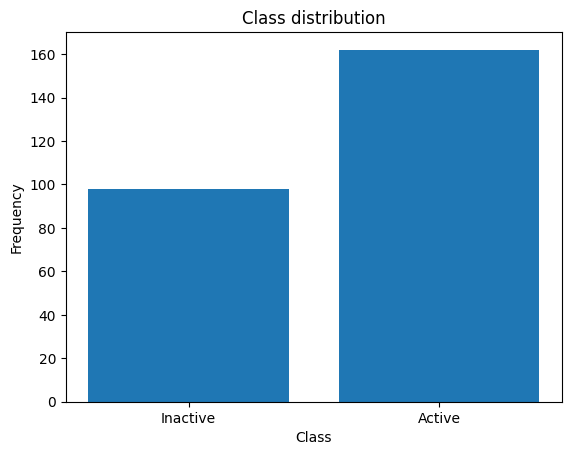

In [198]:
# plot the distribution of the classes
plt.bar(['Inactive', 'Active'], [classes_train.count(0), classes_train.count(1)])
plt.title('Class distribution')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

In [199]:
class_targets_df_train = pd.DataFrame(np.array([classes_train]).T, columns=["classes"])

## Generate features for the training set

In [200]:
submolecule_list_train = [Chem.MolFromSmiles(smiles) for smiles in substratesmiles_train]

In [201]:
calc = Calculator(descriptors, ignore_3D=True)
subfeatures_df_train = calc.pandas(submolecule_list_train)

100%|██████████| 260/260 [00:32<00:00,  8.04it/s]


In [203]:
# Drop columns with NaN values
subfeatures_df_train.dropna(inplace=True, thresh=int(0.9*len(subfeatures_df_train.index)))

# Drop columns with std lower than threshold
threshold = 0.5
subfeatures_df_train.drop(subfeatures_df_train.std()[subfeatures_df_train.std() < threshold].index.values, axis=1)

# Drop columns with values containing the string
subfeatures_df_train.drop(subfeatures_df_train.columns[subfeatures_df_train.isin(['missing']).any()], axis=1)

subfeatures_df_train.columns = [ent.strip() for ent in subfeatures_df_train.columns]
subfeatures_df_train.head()

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,13.682318,11.938414,0,0,22.381359,2.395314,4.705270,22.381359,1.243409,3.801020,...,9.524348,64.026585,261.129969,7.057567,682,22,88.0,99.0,6.055556,4.055556
1,8.813451,8.413992,0,0,14.733860,2.060820,4.121640,14.733860,1.133374,3.386689,...,8.272571,41.358042,186.173213,5.319235,324,11,50.0,49.0,5.972222,3.250000
2,8.813451,8.413992,0,0,14.733860,2.060820,4.121640,14.733860,1.133374,3.386689,...,8.272571,41.358042,202.150370,5.775725,324,11,50.0,49.0,5.972222,3.250000
3,10.934771,9.613927,0,0,18.048677,2.195829,4.391657,18.048677,1.203245,3.579412,...,8.909370,45.412461,206.141913,6.246725,444,15,66.0,69.0,5.583333,3.500000
4,10.934771,9.613927,0,0,18.048677,2.195829,4.391657,18.048677,1.203245,3.579412,...,8.909370,45.412461,222.119070,6.730881,444,15,66.0,69.0,5.583333,3.500000


## Pearson correlation coefficent and Spearman's rank correlation coefficient
In the next cells we can investigate how well each bit correlates against our property of interest and checks for signficance using a one tail permutation test: how many times out of the n_sample do I obtain a correlation coefficient that is greater than the observed value.

In the next block the feature with a reasonable correlation and statistically significant are chosen. The sig_metric is the significance testing metric correlation coefficent names are two tail p tests. to do one tail enter replacing option with gt for greater than and lt for less than and the correction coefficent name one of pearsron, spearman or kendalltau, onetail_$option_$correlation_coefficent.

In [204]:
subreasonable_predicted_properties, subsignificant_features = cwf.find_correlating_features(subfeatures_df_train, target_train.replace('N', 10), thresh=0.2, 
                                                                                      plot=False, corr_method="spearman", 
                                                                                      sig_metric="spearman", process_non_numeric=True, 
                                                                                      sig_level=0.05, significance=True, n_sample=5000)

0      -1.537602
1      10.000000
2      -0.962574
3      10.000000
4       0.483872
         ...    
255    -0.763967
256    -2.050610
257    10.000000
258    -1.712198
259    -0.358625
Name: logec50, Length: 260, dtype: float64
Significance will be calculated for the correlations


nBase: -0.4292 P: 0.0002 Significant at 0.0500 level? True
SpMax_A: -0.2237 P: 0.0006 Significant at 0.0500 level? True
nS: 0.2098 P: 0.0008 Significant at 0.0500 level? True
ATSC0c: -0.2079 P: 0.0014 Significant at 0.0500 level? True
ATSC2c: 0.2510 P: 0.0002 Significant at 0.0500 level? True
ATSC3c: -0.3129 P: 0.0002 Significant at 0.0500 level? True
ATSC4c: 0.3913 P: 0.0002 Significant at 0.0500 level? True
ATSC5c: -0.2204 P: 0.0006 Significant at 0.0500 level? True
ATSC6d: 0.2169 P: 0.0010 Significant at 0.0500 level? True
ATSC7d: 0.2377 P: 0.0002 Significant at 0.0500 level? True
ATSC7v: 0.2045 P: 0.0008 Significant at 0.0500 level? True
ATSC2se: 0.2159 P: 0.0004 Significant at 0.0500 level? True
ATSC2pe: 0.2039 P: 0.0006 Significant at 0.0500 level? True
ATSC2are: 0.2051 P: 0.0006 Significant at 0.0500 level? True
AATSC0c: -0.2643 P: 0.0002 Significant at 0.0500 level? True
AATSC2c: 0.2688 P: 0.0002 Significant at 0.0500 level? True
AATSC3c: -0.3226 P: 0.0002 Significant at 0.0500

In [205]:
#subreasonable_predicted_properties, subsignificant_features

log.info("{} {}".format(len(subreasonable_predicted_properties), subsignificant_features))
log.info("{} {}".format(len(subsignificant_features), subreasonable_predicted_properties))
use_significant = True
use_reasonable = False

86 ['nBase', 'SpMax_A', 'nS', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c', 'ATSC5c', 'ATSC6d', 'ATSC7d', 'ATSC7v', 'ATSC2se', 'ATSC2pe', 'ATSC2are', 'AATSC0c', 'AATSC2c', 'AATSC3c', 'AATSC4c', 'AATSC5c', 'AATSC6d', 'AATSC7v', 'AATSC2se', 'AATSC2p', 'MATS1c', 'MATS2c', 'MATS3c', 'MATS4c', 'MATS6d', 'MATS6s', 'MATS7v', 'MATS2se', 'MATS3se', 'MATS2pe', 'MATS2are', 'MATS3are', 'GATS1c', 'GATS2c', 'GATS3c', 'GATS5c', 'GATS1s', 'GATS2s', 'GATS4v', 'GATS2se', 'GATS5se', 'GATS2pe', 'GATS2are', 'BCUTc-1h', 'BCUTc-1l', 'BCUTd-1l', 'BCUTv-1h', 'BCUTp-1h', 'BCUTi-1l', 'nBondsD', 'AXp-5d', 'NdsCH', 'NdssC', 'NssNH', 'NaaNH', 'NdO', 'NssO', 'SdsCH', 'SdssC', 'SssNH', 'SaaNH', 'SdO', 'SssO', 'PEOE_VSA6', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13', 'EState_VSA3', 'VSA_EState1', 'VSA_EState3', 'VSA_EState5', 'VSA_EState9', 'n5Ring', 'n5HRing', 'nARing', 'n5ARing', 'nAHRing', 'n5AHRing', 'nFRing', 'nFHRing', 'TopoPSA', 'SRW05']
86 ['nBase', 'SpMax_A', 'nS', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c',

In [206]:
subfeats_df_train = pd.DataFrame()

if use_significant is True:
    for k in subsignificant_features:
        subfeats_df_train[k] = subfeatures_df_train[k]
        
elif use_reasonable is True:
    for k in subreasonable_predicted_properties:
        subfeats_df_train[k] = subfeatures_df_train[k]

## Feature categorization

In the following cell, we discretize the features that are categorial. We use the ***cwf.feature_categorization*** function to do this. The function takes a dataframe as input and returns a dataframe with the discretized features. When there is a mix of numerical and categorical features, i.e., when feature_types = "some_categorical", we sugguest the user provide the indices for the categorial features. If not provided, the function will try to guess the categorial features automatically. However, the user should check the output to make sure the automatic guess is correct.


In [207]:
features_df_train_scaled, categorical_indxs_train = cwf.feature_categorization(subfeats_df_train, feature_types = "some_categorical")

-----
Categorical features not provided. Trying to guess the categorical features automatically.
-----
Automatically assigned categorical indices:
[0, 2, 52, 54, 55, 56, 57, 58, 59, 76, 77, 78, 79, 80, 81, 82, 83] 17
Automatically assigned categorical features:
['nBase', 'nS', 'nBondsD', 'NdsCH', 'NdssC', 'NssNH', 'NaaNH', 'NdO', 'NssO', 'n5Ring', 'n5HRing', 'nARing', 'n5ARing', 'nAHRing', 'n5AHRing', 'nFRing', 'nFHRing'] 17
**Please check if the automatic assignment is correct. If not, please provide the indices of the categorical features.**
-----
Numerical features:
['SpMax_A', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c', 'ATSC5c', 'ATSC6d', 'ATSC7d', 'ATSC7v', 'ATSC2se', 'ATSC2pe', 'ATSC2are', 'AATSC0c', 'AATSC2c', 'AATSC3c', 'AATSC4c', 'AATSC5c', 'AATSC6d', 'AATSC7v', 'AATSC2se', 'AATSC2p', 'MATS1c', 'MATS2c', 'MATS3c', 'MATS4c', 'MATS6d', 'MATS6s', 'MATS7v', 'MATS2se', 'MATS3se', 'MATS2pe', 'MATS2are', 'MATS3are', 'GATS1c', 'GATS2c', 'GATS3c', 'GATS5c', 'GATS1s', 'GATS2s', 'GATS4v', '

Index(['SpMax_A', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c', 'ATSC5c', 'ATSC6d',
       'ATSC7d', 'ATSC7v', 'ATSC2se',
       ...
       'nAHRing_0', 'nAHRing_1', 'n5AHRing_0', 'n5AHRing_1', 'nFRing_0',
       'nFRing_1', 'nFRing_2', 'nFHRing_0', 'nFHRing_1', 'nFHRing_2'],
      dtype='object', length=132)
      SpMax_A    ATSC0c    ATSC2c    ATSC3c    ATSC4c    ATSC5c    ATSC6d  \
0    0.644192  0.050622  0.520497  0.310559  0.786210  0.394187  0.226951   
1    0.000000  0.031570  0.600396  0.230051  0.878741  0.347225  0.227247   
2    0.000000  0.001117  0.529450  0.252169  0.893021  0.351575  0.227247   
3    0.260009  0.032376  0.613009  0.194378  0.925132  0.352112  0.236907   
4    0.260009  0.001117  0.543849  0.227593  0.920781  0.353352  0.236907   
..        ...       ...       ...       ...       ...       ...       ...   
255  0.680681  0.183453  0.745838  0.190698  0.616256  0.605401  0.349338   
256  0.696118  0.219926  0.739973  0.150424  0.729772  0.555373  0.346678   
25

### Add in experimental / custom features

In [208]:
features_df_train = features_df_train_scaled.copy()

In [209]:
feats_to_add = ['cl_conc_(mm)', 'time_between_transporter_added_and_lysis_(s)']

train_data = train_data.reset_index(drop=True)

for f in feats_to_add:
    features_df_train[f] = train_data[f]

substructure_name_list = ['thiourea',
                     'urea', 
                     'squaramide', 
                     'indole', 
                     'tambjamine', 
                     'carbazole', 
                     'acridinone', 
                     'perenosin',
                     'bisbzimpy', 
                     'isophthalamides_dipicolineamides']

for f in substructure_name_list:
    features_df_train[f] = train_data[f]

In [210]:
features_df_train.to_csv("features_train.csv")

In [211]:
feature_types = 'some_categorical'

## Synthetic sampling for the training

In [212]:
nneighbours = min(5, len(class_targets_df_train[class_targets_df_train["classes"]==1].index)-1)
log.info("Number of neighbours used for SMOTE: {}".format(nneighbours))

# feature_types is set when the fingerprints are calculated
# No catagorical
if feature_types == "no_catagorical":
    sm = SMOTE(sampling_strategy="not majority", random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)
# Some catagorical - Need to provide the indexes
elif feature_types == "some_catagorical":
    sm = SMOTENC(sampling_strategy="not majority", categorical_features=categorical_indxs_train, random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)
# All catagorical
elif feature_types == "catagorical":
    sm = SMOTEN(sampling_strategy="not majority", random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)

Number of neighbours used for SMOTE: 5


In [213]:
log.info("Number of features: {}".format(len(features_df_train.columns.values)))
log.info("Feature decriptions:\n{}".format(features_df_train.columns.values))
log.info("Classes/Targets descriptions:\n{}".format(class_targets_df_train.columns.values))

Number of features: 144
Feature decriptions:
['SpMax_A' 'ATSC0c' 'ATSC2c' 'ATSC3c' 'ATSC4c' 'ATSC5c' 'ATSC6d' 'ATSC7d'
 'ATSC7v' 'ATSC2se' 'ATSC2pe' 'ATSC2are' 'AATSC0c' 'AATSC2c' 'AATSC3c'
 'AATSC4c' 'AATSC5c' 'AATSC6d' 'AATSC7v' 'AATSC2se' 'AATSC2p' 'MATS1c'
 'MATS2c' 'MATS3c' 'MATS4c' 'MATS6d' 'MATS6s' 'MATS7v' 'MATS2se' 'MATS3se'
 'MATS2pe' 'MATS2are' 'MATS3are' 'GATS1c' 'GATS2c' 'GATS3c' 'GATS5c'
 'GATS1s' 'GATS2s' 'GATS4v' 'GATS2se' 'GATS5se' 'GATS2pe' 'GATS2are'
 'BCUTc-1h' 'BCUTc-1l' 'BCUTd-1l' 'BCUTv-1h' 'BCUTp-1h' 'BCUTi-1l'
 'AXp-5d' 'SdsCH' 'SdssC' 'SssNH' 'SaaNH' 'SdO' 'SssO' 'PEOE_VSA6'
 'PEOE_VSA10' 'PEOE_VSA11' 'PEOE_VSA12' 'PEOE_VSA13' 'EState_VSA3'
 'VSA_EState1' 'VSA_EState3' 'VSA_EState5' 'VSA_EState9' 'TopoPSA' 'SRW05'
 'nBase_0' 'nBase_1' 'nS_0' 'nS_1' 'nS_2' 'nS_3' 'nBondsD_0' 'nBondsD_1'
 'nBondsD_2' 'nBondsD_3' 'nBondsD_4' 'nBondsD_5' 'nBondsD_6' 'NdsCH_0'
 'NdsCH_1' 'NdsCH_2' 'NdssC_0' 'NdssC_1' 'NdssC_2' 'NdssC_3' 'NdssC_4'
 'NssNH_0' 'NssNH_1' 'NssNH_2' 'Nss

In [214]:
# drop columns with missing values in features_df_train
features_df_train = features_df_train.dropna(axis=1)

In [215]:
features_smote_train, classes_smote_train = sm.fit_resample(features_df_train.to_numpy(), class_targets_df_train.to_numpy())
n_sythetic_points = features_smote_train.shape[0] - len(features_df_train.index)
log.info("SMOTE has added {} sythetic features to balance the classes".format(n_sythetic_points))

The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
SMOTE has added 64 sythetic features to balance the classes


In [216]:
log.info("Resampled X\n{}\n{}\nResampled y:\n{}\n{}".format(features_smote_train, features_smote_train.shape, classes_smote_train, classes_smote_train.shape))

Resampled X
[[0.64419202 0.05062246 0.52049746 ... 0.         0.         0.        ]
 [0.         0.03156954 0.6003963  ... 0.         0.         0.        ]
 [0.         0.00111739 0.52945045 ... 0.         0.         0.        ]
 ...
 [0.50437908 0.04443161 0.56792698 ... 0.         0.         0.        ]
 [0.52498257 0.18522648 0.73799282 ... 0.         0.         0.        ]
 [0.26000916 0.00111729 0.54384899 ... 0.         0.         0.        ]]
(324, 144)
Resampled y:
[1 0 1 0 0 0 1 1 1 1 1 1 1 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 1 0 1 1 1 0 1 0 0
 0 1 0 1 0 1 0 0 0 0 1 1 1 1 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 1 0 1 1 1
 1 1 0 1 1 1 1 0 1 1 1 0 0 0 0 1 1 1 1 1 0 0 1 0 1 1 1 1 0 0 0 1 1 0 0 1 0
 1 0 1 1 0 0 1 0 1 1 0 0 0 1 1 1 1 1 1 0 0 0 0 0 1 1 0 0 1 1 1 1 0 0 0 1 1
 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 0 1 0 1 1 0 1 0 1 1 1
 0 1 1 1 1 1 1 0 1 0 1 1 1 1 0 1 0 0 0 1 1 1 0 0 1 1 0 1 0 0 1 0 0 1 1

In [217]:
features_smote_df_train = pd.DataFrame(data=features_smote_train, columns=features_df_train.columns.values)
classes_smote_df_train = pd.DataFrame(data=classes_smote_train, columns=["classes"])

comb_df_res = features_smote_df_train.copy()
comb_df_res["classes"] = classes_smote_train
comb_df_res.to_csv("resampled_synthetic_data_set_train.csv")
comb_df_res

,SpMax_A,ATSC0c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6d,ATSC7d,ATSC7v,ATSC2se,...,urea,squaramide,indole,tambjamine,carbazole,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides,classes
0,0.644192,0.050622,0.520497,0.310559,0.786210,0.394187,0.226951,0.767767,0.396714,0.147862,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,0.000000,0.031570,0.600396,0.230051,0.878741,0.347225,0.227247,0.765820,0.634671,0.172124,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.000000,0.001117,0.529450,0.252169,0.893021,0.351575,0.227247,0.765820,0.481112,0.146911,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,0.260009,0.032376,0.613009,0.194378,0.925132,0.352112,0.236907,0.772329,0.629254,0.173527,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,0.260009,0.001117,0.543849,0.227593,0.920781,0.353352,0.236907,0.772329,0.483551,0.149075,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319,0.524983,0.185226,0.737993,0.069668,0.474978,0.334513,0.254034,0.720276,0.797494,0.495426,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
320,0.355883,0.005731,0.544024,0.200707,0.411955,0.307568,0.266900,0.731147,0.769091,0.147651,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
321,0.504379,0.044432,0.567927,0.040226,0.585539,0.372502,0.234743,0.737083,0.600910,0.167466,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
322,0.524983,0.185226,0.737993,0.181633,0.411955,0.307568,0.254034,0.720276,0.817288,0.193561,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


# Handling the Test set

## Generate features for the test set

In [218]:
submolecule_list_test= [Chem.MolFromSmiles(smiles) for smiles in substratesmiles_test]

In [219]:
calc = Calculator(descriptors, ignore_3D=True)
subfeatures_df_test = calc.pandas(submolecule_list_test)

100%|██████████| 44/44 [00:05<00:00,  8.13it/s]


In [220]:
subfeatures_df_test_categorized, categorical_indxs_test = cwf.feature_categorization(subfeatures_df_test)

-----
Categorical features not provided. Trying to guess the categorical features automatically.
-----
Automatically assigned categorical indices:
[2, 3, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 771, 772, 773, 774, 775, 776, 777, 778, 779, 782, 783, 784, 785, 786, 787, 788, 789, 790, 891, 892, 893, 894, 895, 896, 897, 898, 899, 900, 901, 902, 903, 904, 905, 906, 907, 908, 909, 910, 911, 912, 913, 914, 915, 916, 917, 918, 919, 920, 921, 922, 923, 924, 925, 926, 927, 928, 929, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 940, 941, 942, 943, 944, 945, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 977, 979, 982, 983, 989, 990, 991, 992, 996, 999, 1002, 1003, 1006, 1008, 1009, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1037, 1038, 1039, 1

In [221]:
test_data = test_data.reset_index(drop=True)
for f in feats_to_add:
    subfeatures_df_test_categorized[f] = test_data[f]
    
for f in substructure_name_list:
    subfeatures_df_test_categorized[f] = test_data[f]

In [222]:
testfeats_df_sub = pd.DataFrame()
testcontinous_features = []
testcatagorical_features = []

# Make sure feature cover all of the molecule if not don't use them as we will loose data points doing this
n_features = len(target_train)
print("Number of features: ", n_features)
print(features_df_train.columns)

# Add descriptors
for ent in features_df_train.columns:
    if ent in subfeatures_df_test_categorized.columns:
        testfeats_df_sub[ent] = subfeatures_df_test_categorized[ent].values 
        testcontinous_features.append(ent)
    else:
        testfeats_df_sub[ent] = 0.0

Number of features:  260
Index(['SpMax_A', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c', 'ATSC5c', 'ATSC6d',
       'ATSC7d', 'ATSC7v', 'ATSC2se',
       ...
       'thiourea', 'urea', 'squaramide', 'indole', 'tambjamine', 'carbazole',
       'acridinone', 'perenosin', 'bisbzimpy',
       'isophthalamides_dipicolineamides'],
      dtype='object', length=144)


DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

In [223]:
features_df_test = testfeats_df_sub.copy()

# Define Xtrain, Xtest, Ytrain, Ytest

In [224]:
Xtrain = features_df_train
Xtest = features_df_test
Ytrain = class_targets_df_train
Ytest = classes_test

In [225]:
# save all the dataframes to csv files
Xtrain.to_csv('Xtrain.csv', index=False)
Xtest.to_csv('Xtest.csv', index=False)
Ytrain.to_csv('ytrain.csv', index=False)
pd.DataFrame(Ytest).to_csv('ytest.csv', index=False)

# Time for ML

In [226]:
kfold_clf_names = [
    "Nearest Neighbors", 
    "Gaussian Process",
    "Decision Tree", 
    "ExtraTreesClassifier", 
    "AdaBoost",
    "Logistic Regression"]

kfold_classifiers = [
     KNeighborsClassifier(),
     GaussianProcessClassifier(random_state=random_seed, n_jobs=-1),
     DecisionTreeClassifier(random_state=random_seed),
     ExtraTreesClassifier(random_state=random_seed, n_jobs=-1),
     AdaBoostClassifier(random_state=random_seed),
    LogisticRegression(random_state=random_seed, n_jobs=-1, solver="lbfgs")]

kfold_classifier_parameters = {
     "Nearest Neighbors": {"n_neighbors": [ent for ent in range(2, 10, 1)]},
     "Gaussian Process": {"kernel":[1.0 * Matern(length_scale=1.0, nu=1.5), 1.0 * Matern(length_scale=1.0, nu=2.5), 1.0 * RBF(1.0),  1.0 * RBF(1.0) + WhiteKernel(noise_level=0.5)]},
     "Decision Tree": {"max_depth": [2, 3, 4, 5, 7, 10]},
     "ExtraTreesClassifier": {"max_depth": [2, 3, 4, 5, 7, 10], "n_estimators": [10, 20, 50, 100]},
     "AdaBoost": {"n_estimators": [10, 20, 50, 100]},
    "Logistic Regression": {"penalty":["l2"], "C": [0.05, 0.1, 0.25, 0.5, 1.0, 1.25]}
}

In [227]:
cwf.test_classifiers_with_optimization(Xtrain,Xtest, Ytrain , Ytest, kfold_classifiers, kfold_classifier_parameters, 
                                                        overwrite=True, cv=5, n_repeats=10,
                                                        random_seed=random_seed, clf_names=kfold_clf_names, class_labels=(0,1))

Features: Index(['SpMax_A', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c', 'ATSC5c', 'ATSC6d',
       'ATSC7d', 'ATSC7v', 'ATSC2se',
       ...
       'thiourea', 'urea', 'squaramide', 'indole', 'tambjamine', 'carbazole',
       'acridinone', 'perenosin', 'bisbzimpy',
       'isophthalamides_dipicolineamides'],
      dtype='object', length=144)
Using unscaled features
data:
     index   SpMax_A    ATSC0c    ATSC2c    ATSC3c    ATSC4c    ATSC5c  \
0        0  0.644192  0.050622  0.520497  0.310559  0.786210  0.394187   
1        1  0.000000  0.031570  0.600396  0.230051  0.878741  0.347225   
2        2  0.000000  0.001117  0.529450  0.252169  0.893021  0.351575   
3        3  0.260009  0.032376  0.613009  0.194378  0.925132  0.352112   
4        4  0.260009  0.001117  0.543849  0.227593  0.920781  0.353352   
..     ...       ...       ...       ...       ...       ...       ...   
255    255  0.680681  0.183453  0.745838  0.190698  0.616256  0.605401   
256    256  0.696118  0.219926  0.7399

	Best parameters; {'n_neighbors': 7}
	0.6553 (+/-0.1040) for {'n_neighbors': 2}
	0.6141 (+/-0.1090) for {'n_neighbors': 3}
	0.6192 (+/-0.1120) for {'n_neighbors': 4}
	0.6390 (+/-0.0886) for {'n_neighbors': 5}
	0.6452 (+/-0.0893) for {'n_neighbors': 6}
	0.6591 (+/-0.1129) for {'n_neighbors': 7}
	0.6434 (+/-0.1237) for {'n_neighbors': 8}
	0.6537 (+/-0.1084) for {'n_neighbors': 9}

	----- Predicting using: Nearest_Neighbors -----
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
	ROC analysis area under the curve: 0.8126315789473684
	Confusion matrix (Nearest_Neighbors):
[[13  6]
 [ 6 19]]


	score (Nearest_Neighbors): 0.7272727272727273
	Imbalance reports:
	Imbalance classification report:
                   pre       rec       spe        f1       geo       iba       sup

          0       0.68      0.68      0.76      0.68      0.72      0.52        19
          1       0.76      0.76      0.68      0.76  

In [228]:
directory_names = cwf.directory_names(kfold_clf_names)


Nearest_Neighbors
-------------

Reading 0.csv
Saving plot to fig_MLtestset_nearest_neighbors_morgan.png
['fig_MLtestset_nearest_neighbors_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 13, 'fp': 6, 'fn': 6, 'tp': 19}


[[13  6]
 [ 6 19]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report

Gaussian_Process
-------------

Reading 0.csv
Saving plot to fig_MLtestset_gaussian_process_morgan.png
['fig_MLtestset_nearest_neighbors_morgan.png', 'fig_MLtestset_gaussian_process_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 19, 'fp': 0, 'fn': 4, 'tp': 21}
[[19  0]
 [ 4 21]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Decision_Tree
-------------

Reading 0.csv
Saving plot to fig_MLtestset_decision_tree_morgan.png
['fig_MLtestset_nearest_neighbors_morgan.png', 'fig_MLtestset_gaussian_process_morgan.png', 'fig_MLtestset_decision_tree_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 15, 'fp': 4, 'fn': 13, 'tp': 12}
[[15  4]
 [13 12]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

ExtraTreesClassifier
-------------

Reading 0.csv
Saving plot to fig_MLtestset_extratreesclassifier_morgan.png
['fig_MLtestset_nearest_neighbors_morgan.png', 'fig_MLtestset_gaussian_process_morgan.png', 'fig_MLtestset_decision_tree_morgan.png', 'fig_MLtestset_extratreesclassifier_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 16, 'fp': 3, 'fn': 2, 'tp': 23}
[[16  3]
 [ 2 23]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

AdaBoost
-------------

Reading 0.csv
Saving plot to fig_MLtestset_adaboost_morgan.png
['fig_MLtestset_nearest_neighbors_morgan.png', 'fig_MLtestset_gaussian_process_morgan.png', 'fig_MLtestset_decision_tree_morgan.png', 'fig_MLtestset_extratreesclassifier_morgan.png', 'fig_MLtestset_adaboost_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 1, 'fp': 18, 'fn': 1, 'tp': 24}
[[ 1 18]
 [ 1 24]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Logistic_Regression
-------------

Reading 0.csv
Saving plot to fig_MLtestset_logistic_regression_morgan.png
['fig_MLtestset_nearest_neighbors_morgan.png', 'fig_MLtestset_gaussian_process_morgan.png', 'fig_MLtestset_decision_tree_morgan.png', 'fig_MLtestset_extratreesclassifier_morgan.png', 'fig_MLtestset_adaboost_morgan.png', 'fig_MLtestset_logistic_regression_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 15, 'fp': 4, 'fn': 6, 'tp': 19}
[[15  4]
 [ 6 19]]
(0, 1)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
\begin{tabular}{lrrrrrr}
\toprule
{} &  Accuracy &  Sensitivity &  Specificity &   MCC &  Precision &  G-mean \\
\midrule
nearest neighbors    &      0.73 &         0.76 &         0.68 &  0.44 &       0.76 &    0.72 \\
gaussian process     &      0

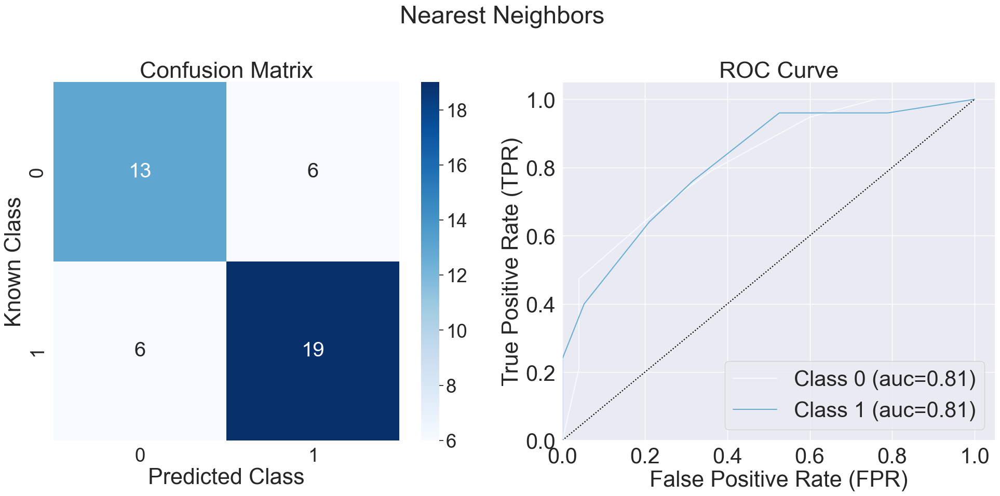

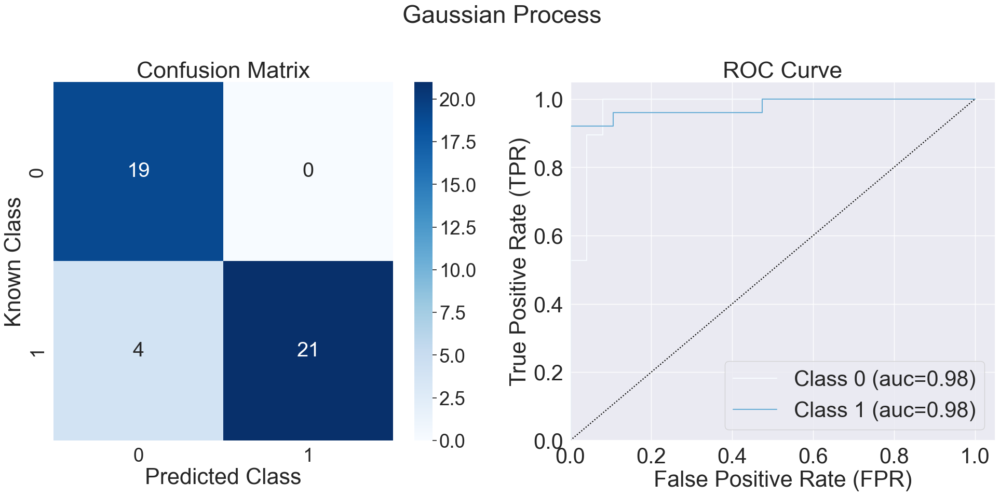

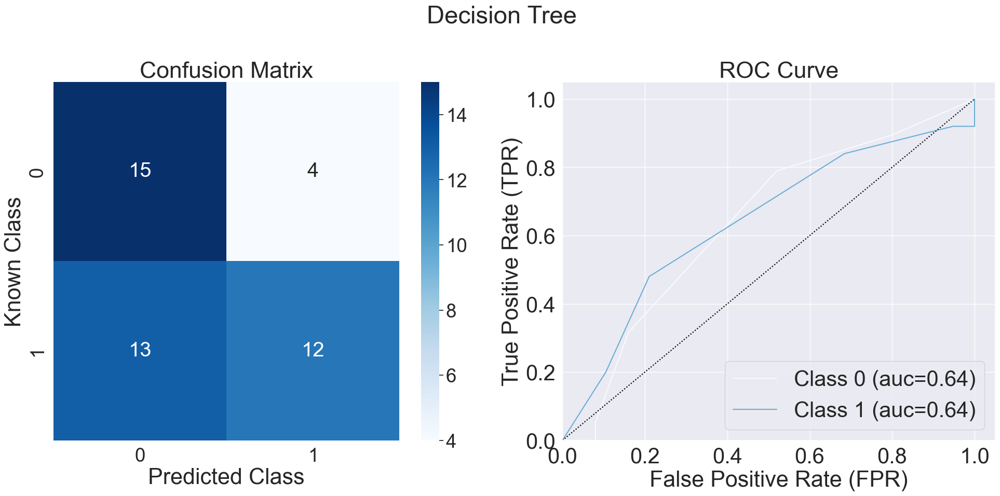

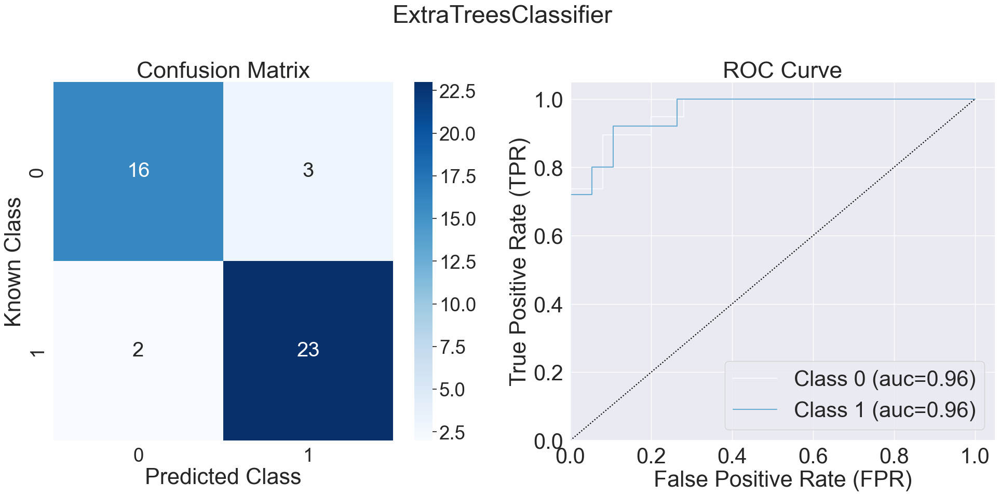

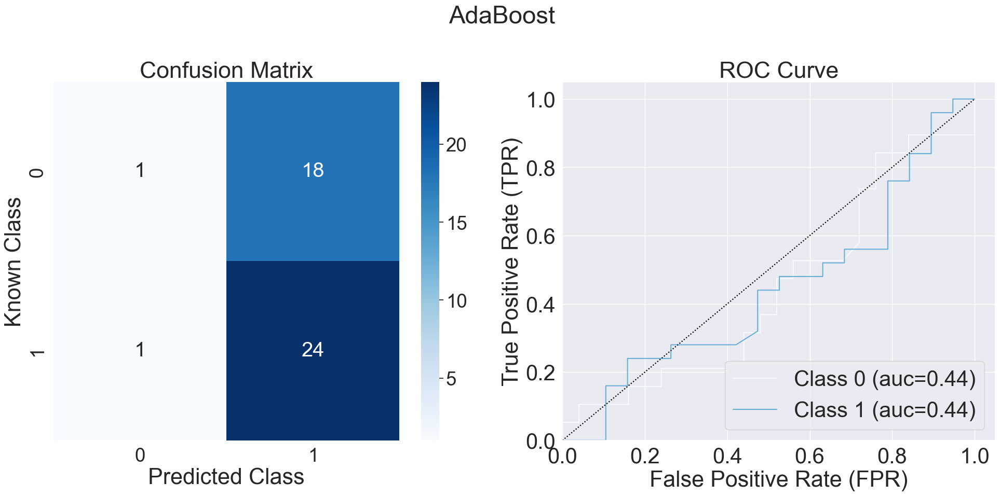

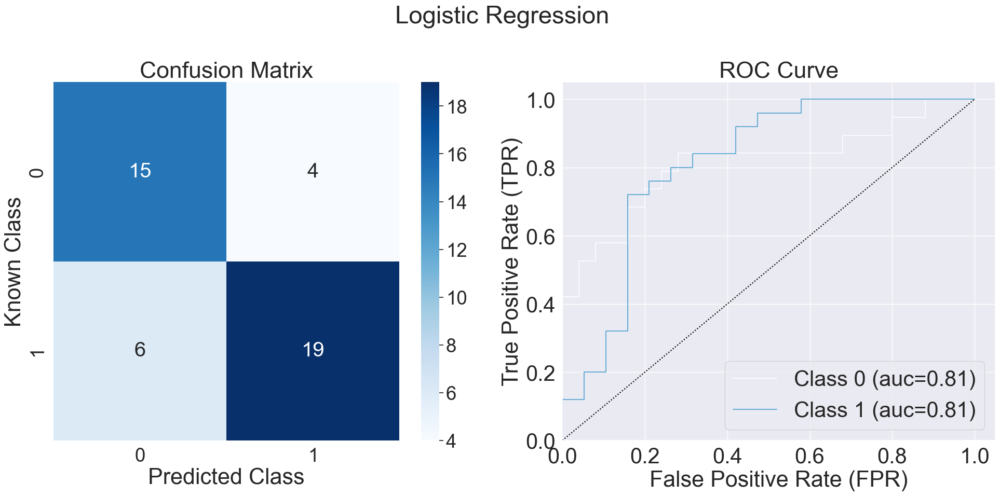

In [231]:
files_plt = []

for ith, dirname in enumerate(directory_names):
    log.info("\n{}\n-------------\n".format(dirname))
    data = cwf.build_data_from_directory(dirname, max_folds=1)
    
    probs = data[["prob0", "prob1"]].to_numpy()
    log.debug("Probablities for a few examples {}".format(probs[0:3,0:2]))
    
    cm = cmetrics.get_confusion_matrix(data, predicted_column_name="prediction", known_column_name="known", return_dict=False)
    log.debug("Confusion matrix for {}\n{}".format(dirname, cm))
    
    plt_name = "fig_MLtestset_{}_morgan.png".format("_".join([ent.lower() for ent in dirname.split()]))
    files_plt.append(plt_name)
    log.info("Saving plot to {}\n{}".format(plt_name, files_plt))
    metrics = cmetrics.calculate_confusion_based_metrics(df=data, probabilities=probs, col_map="Blues", positive_label=1, 
                                                         plt_filename=plt_name, all_classes=False, get_roc_curve=True, 
                                                         get_pr_curve=False, annotate=True, vmin=0, vmax=85,
                                                         title="{}".format(kfold_clf_names[ith]))
    
    metrics_for_paper = {
    "Accuracy": metrics["accuracy"].round(2),
    "Sensitivity": metrics["tpr"].round(2),
    "Specificity": metrics["tnr"].round(2),
    "MCC": metrics["matthews_correlation_coefficient"].round(2),
    "Precision": metrics["precision"].round(2),
    "G-mean": metrics["g-mean"].round(2),
    }
    
    if ith == 0:
        df_metrics_for_paper = pd.DataFrame(data=metrics_for_paper, index=[kfold_clf_names[ith].lower()])
    else:
        df_metrics_for_paper = df_metrics_for_paper.append(pd.Series(metrics_for_paper, name=kfold_clf_names[ith].lower()))
    log.debug(df_metrics_for_paper)

with open("metrics_mordred.tex", "w") as fout:
    cap = "Classifier metrics for balanced data with models built from mordred features. MCC is the Matthew’s correlation coefficent."
    df_metrics_for_paper.to_latex(fout, float_format="{:0.2f}".format, position="H", caption=cap, label="tbl:mordred_features")
log.info(df_metrics_for_paper.to_latex())

In [233]:
images = [Image.open(x) for x in files_plt]
log.info("Combining {} images".format(len(images)))
widths, heights = zip(*(i.size for i in images))
log.info("{}".format("\n".join("W: {} H: {}".format(wid, hgt) for wid, hgt in zip(widths, heights))))
total_height = sum(heights)
total_width = max(widths)

log.info("New image will be W:{} H:{}".format(total_width, total_height))

combined_image = Image.new("RGBA", (total_width, total_height))
y_offset = 0
for ith, img in enumerate(images):
    log.info("Image {} added at offset height {}".format(ith, y_offset))
    combined_image.paste(img, (0, y_offset))
    y_offset = y_offset + img.size[1]

combined_image.save("combined_mordred.png")

Combining 6 images
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
New image will be W:6000 H:18000
Image 0 added at offset height 0
Image 1 added at offset height 3000
Image 2 added at offset height 6000
Image 3 added at offset height 9000
Image 4 added at offset height 12000
Image 5 added at offset height 15000


# Analysis

In [234]:
try:
    import shap
except ImportError:
    !pip install shap
    import shap
from pythia import scaling
import joblib
from glob import glob
import joblib

In [235]:
model_files = glob("*.sav")
model_files

['model_Nearest_Neighbors.sav',
 'model_ExtraTreesClassifier.sav',
 'model_AdaBoost.sav',
 'model_Decision_Tree.sav',
 'model_Gaussian_Process.sav',
 'model_Logistic_Regression.sav']

## Feature importances

### Permutation feature importance

In [236]:
# combine Xtrain and Xtest dataframes
X = pd.concat([Xtrain, Xtest])

# combine Ytrain and Ytest lists
Y = np.concatenate((Ytrain.classes.tolist(), Ytest), axis=0)

model_Nearest_Neighbors.sav
on test set
Nearest Neighbors


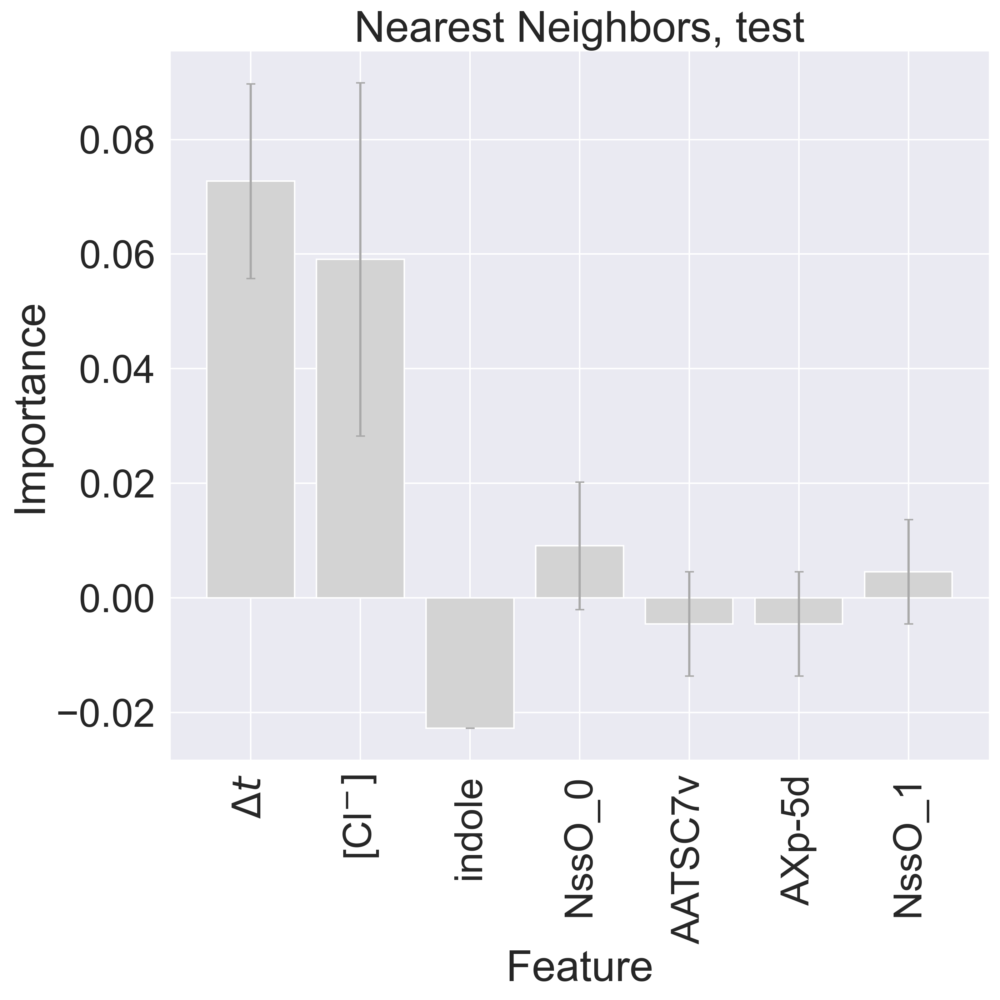

on train set
Nearest Neighbors


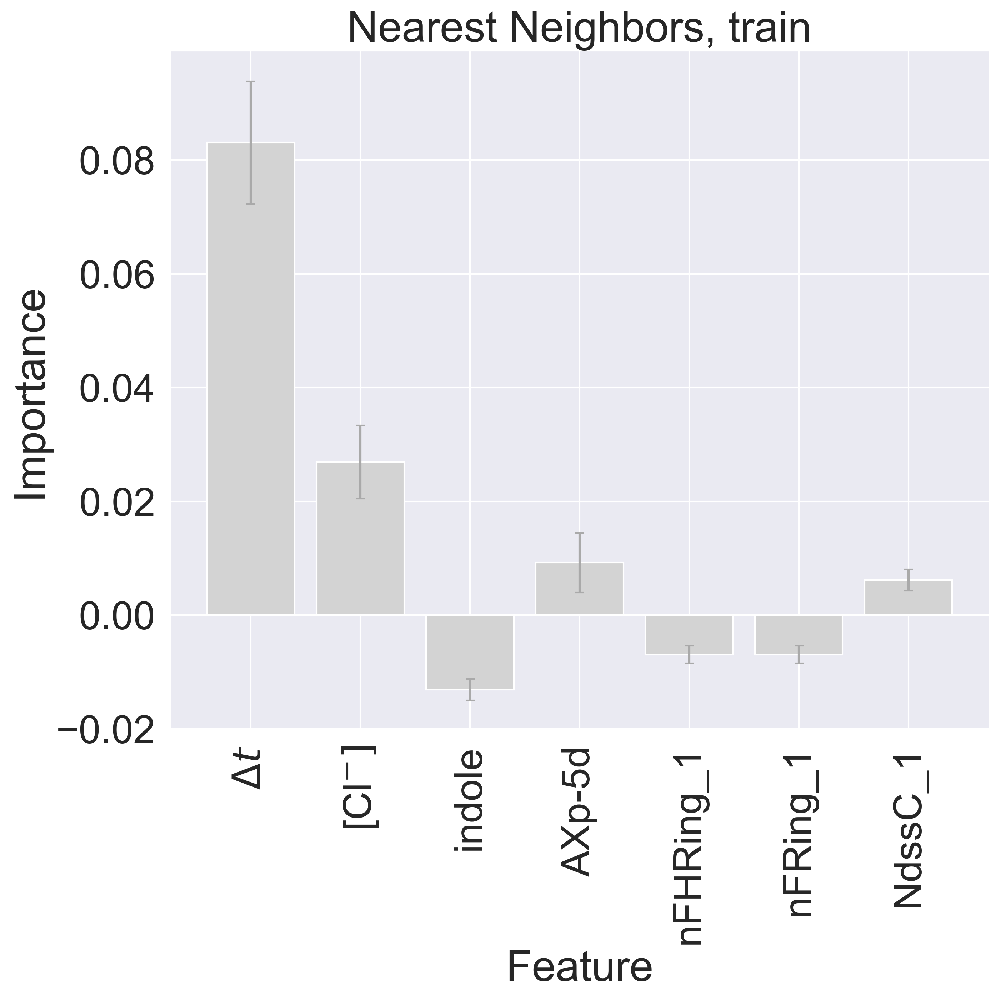

on all set
Nearest Neighbors


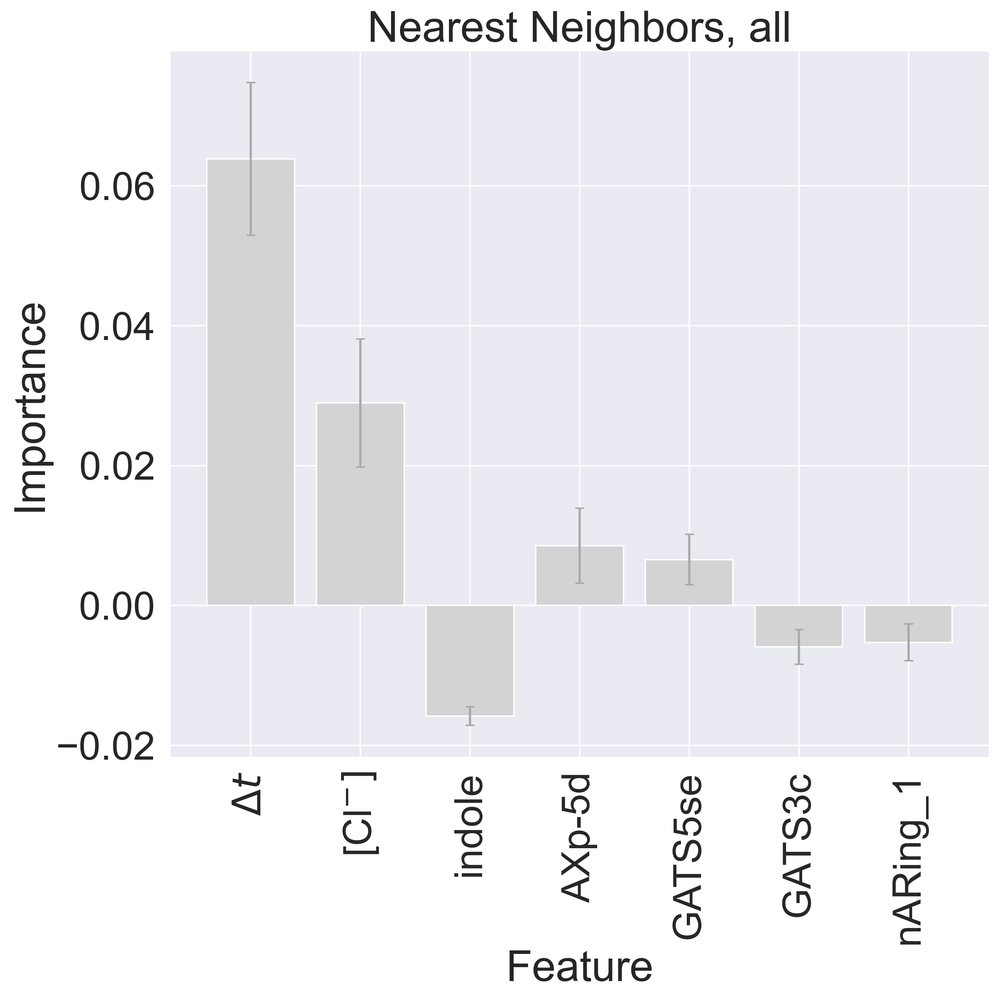

model_ExtraTreesClassifier.sav
on test set
ExtraTreesClassifier


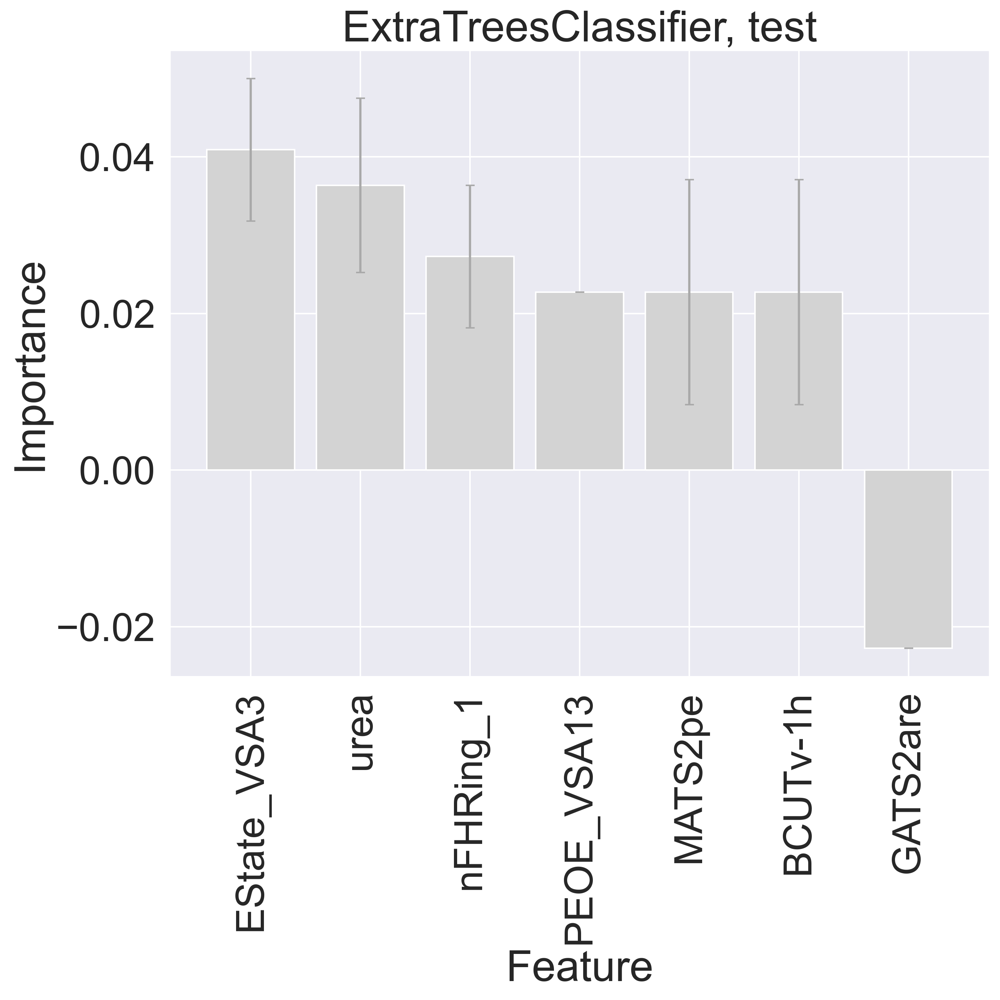

on train set
ExtraTreesClassifier


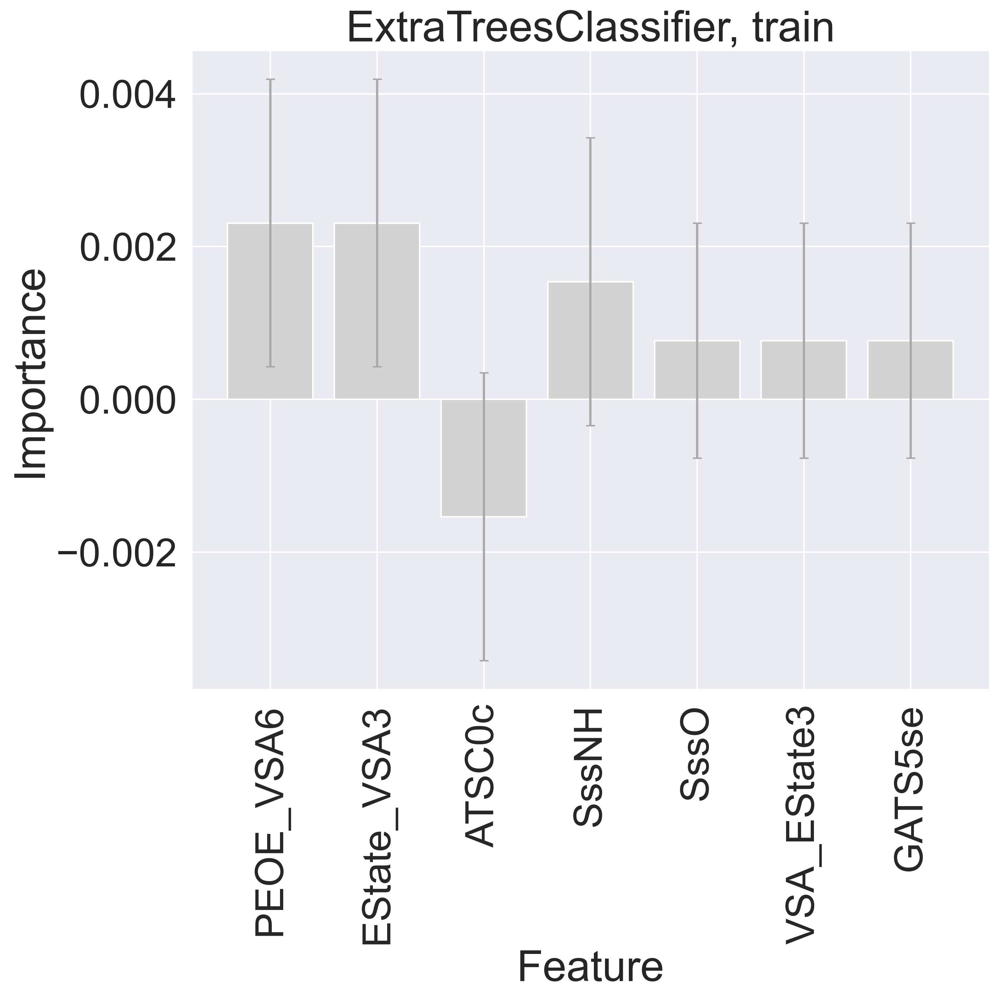

on all set
ExtraTreesClassifier


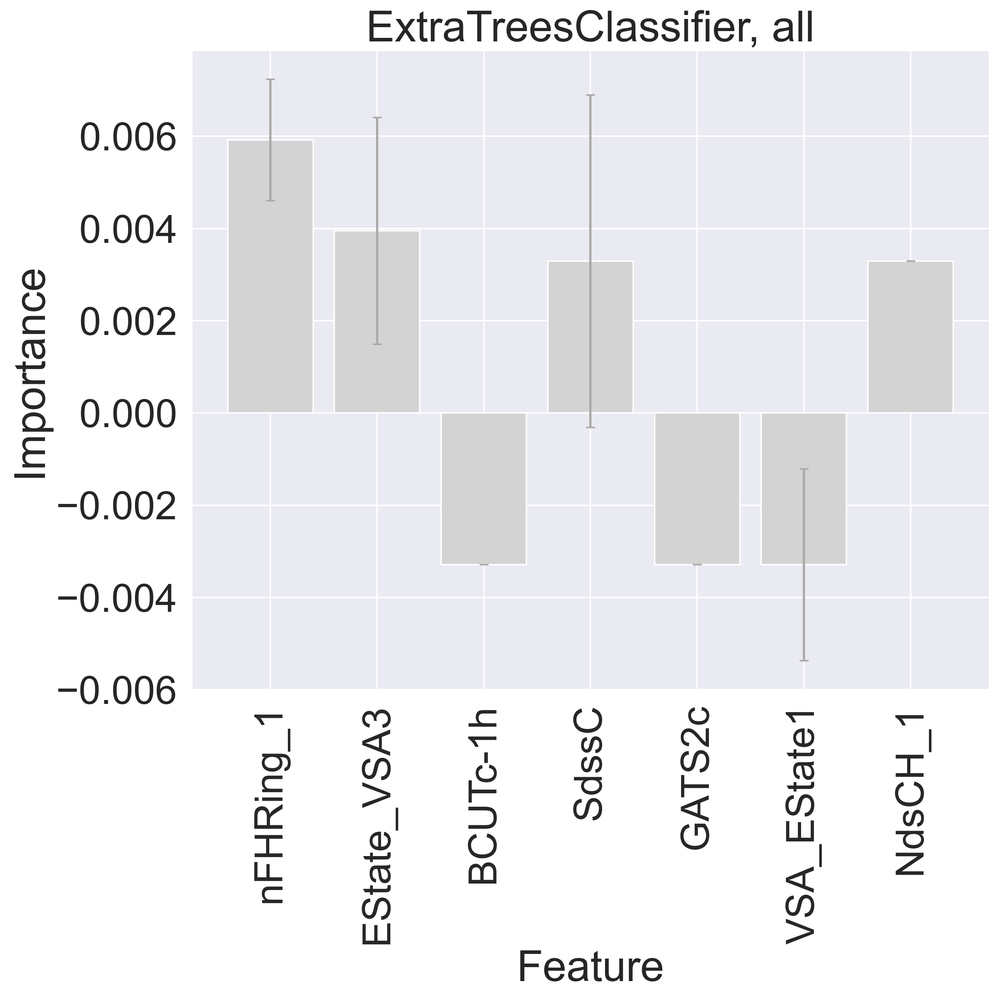

model_AdaBoost.sav
on test set
AdaBoost


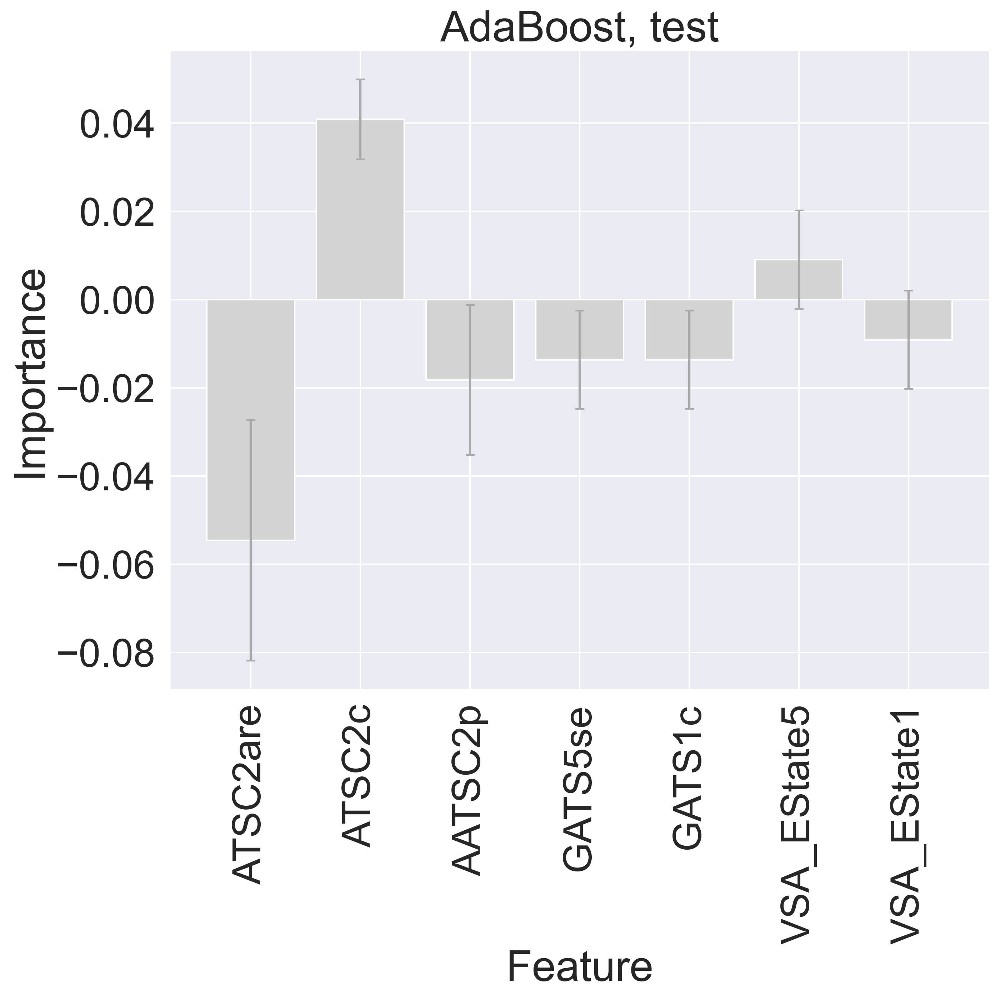

on train set
AdaBoost


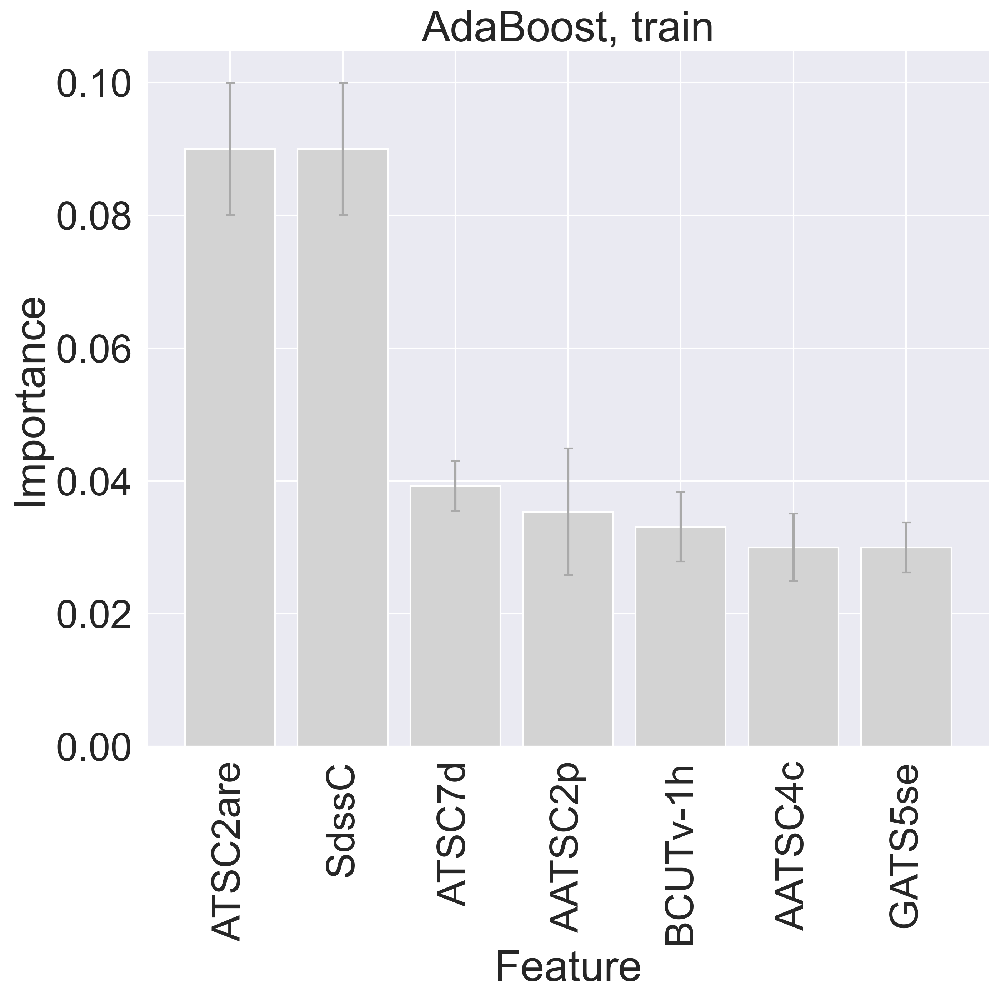

on all set
AdaBoost


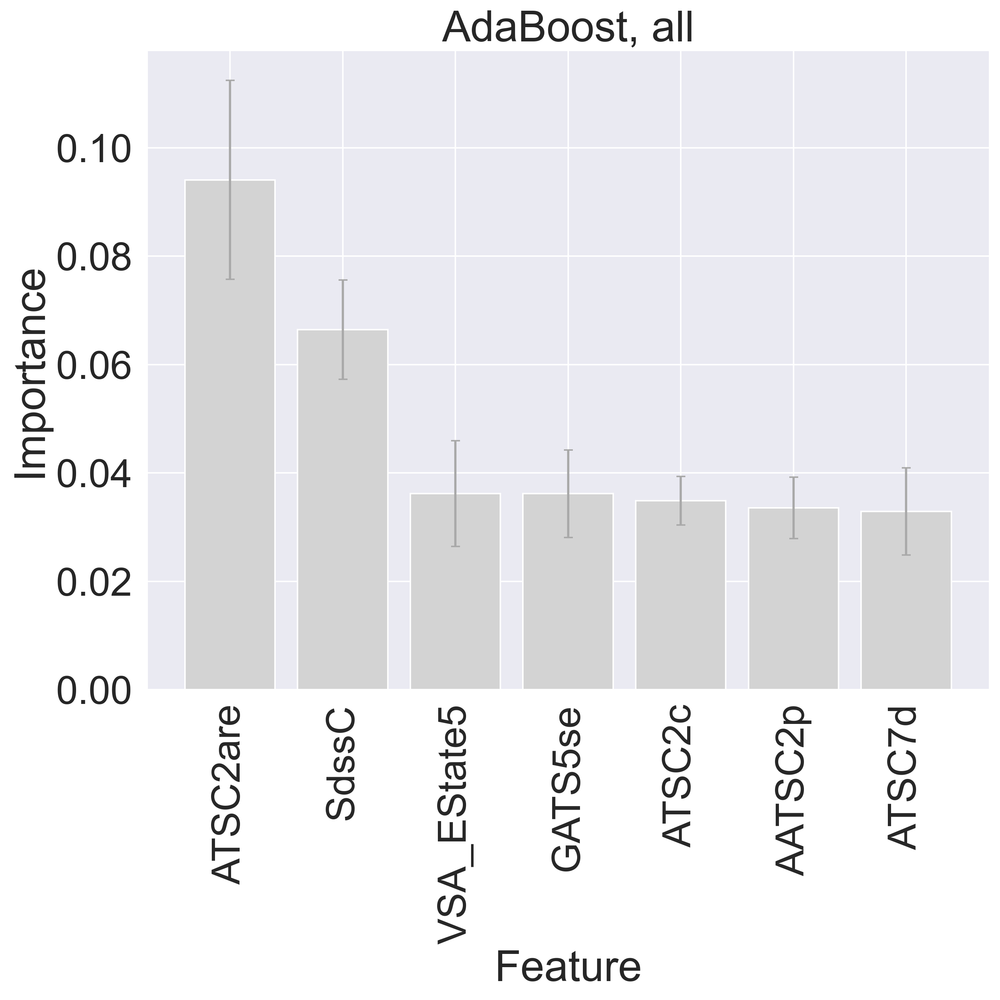

model_Decision_Tree.sav
on test set
Decision Tree


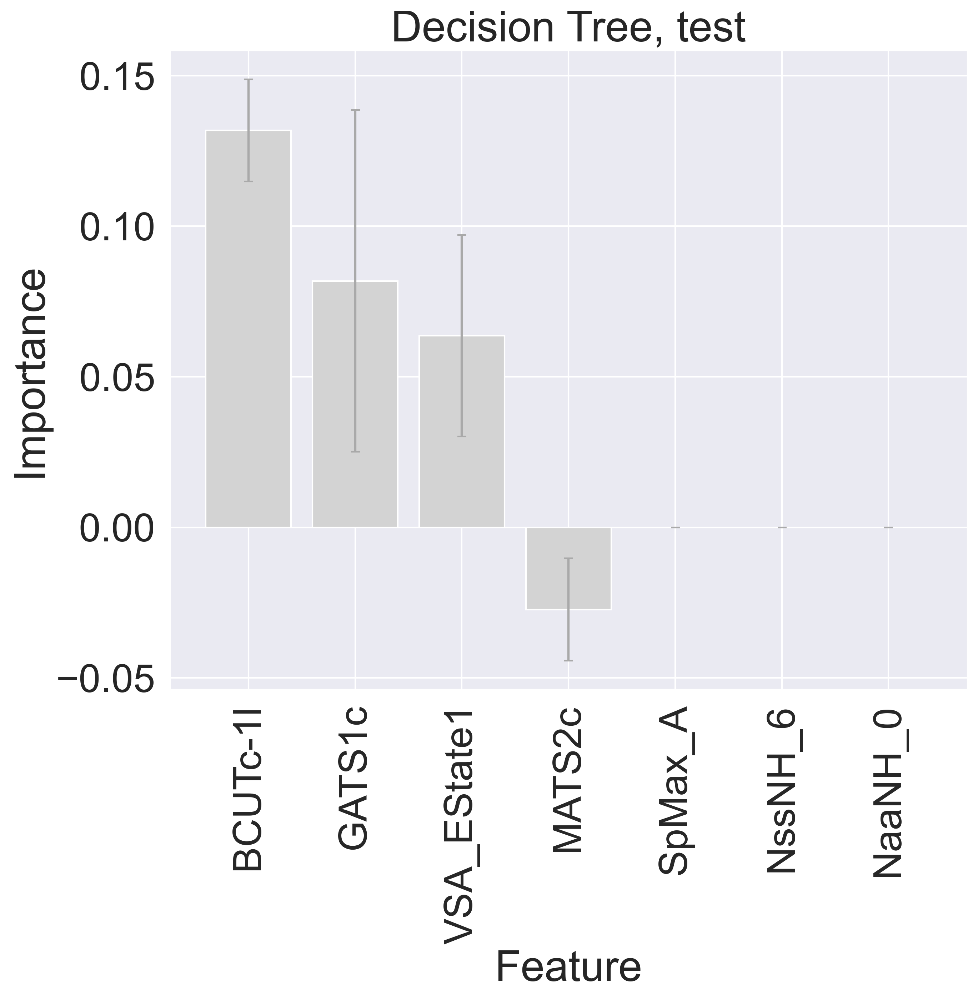

on train set
Decision Tree


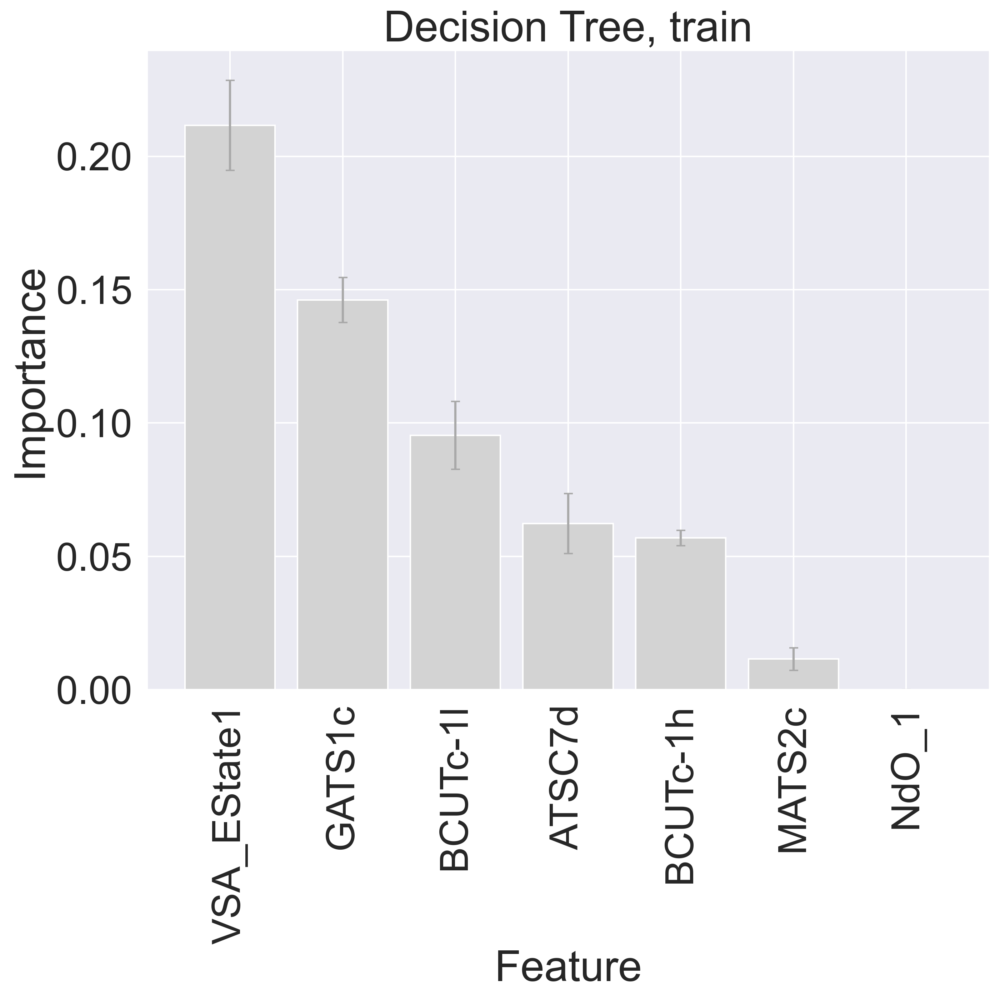

on all set
Decision Tree


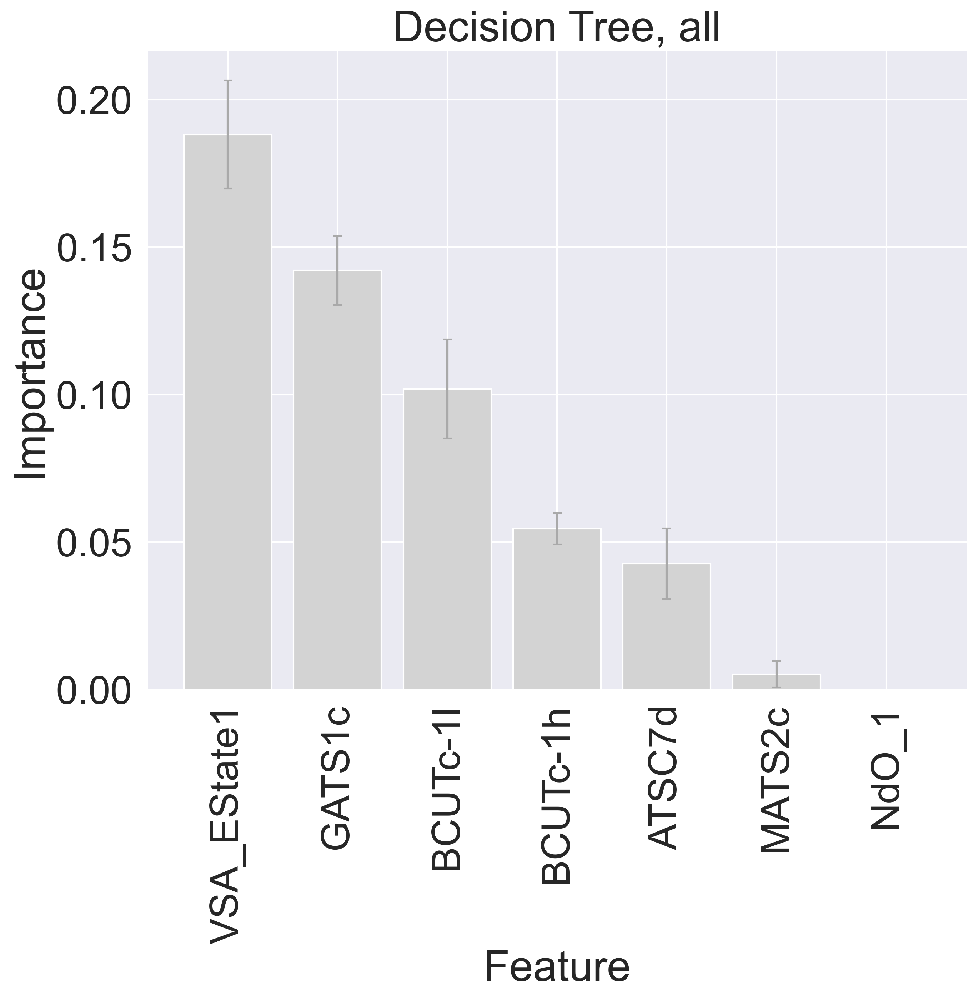

model_Gaussian_Process.sav
on test set
Gaussian Process


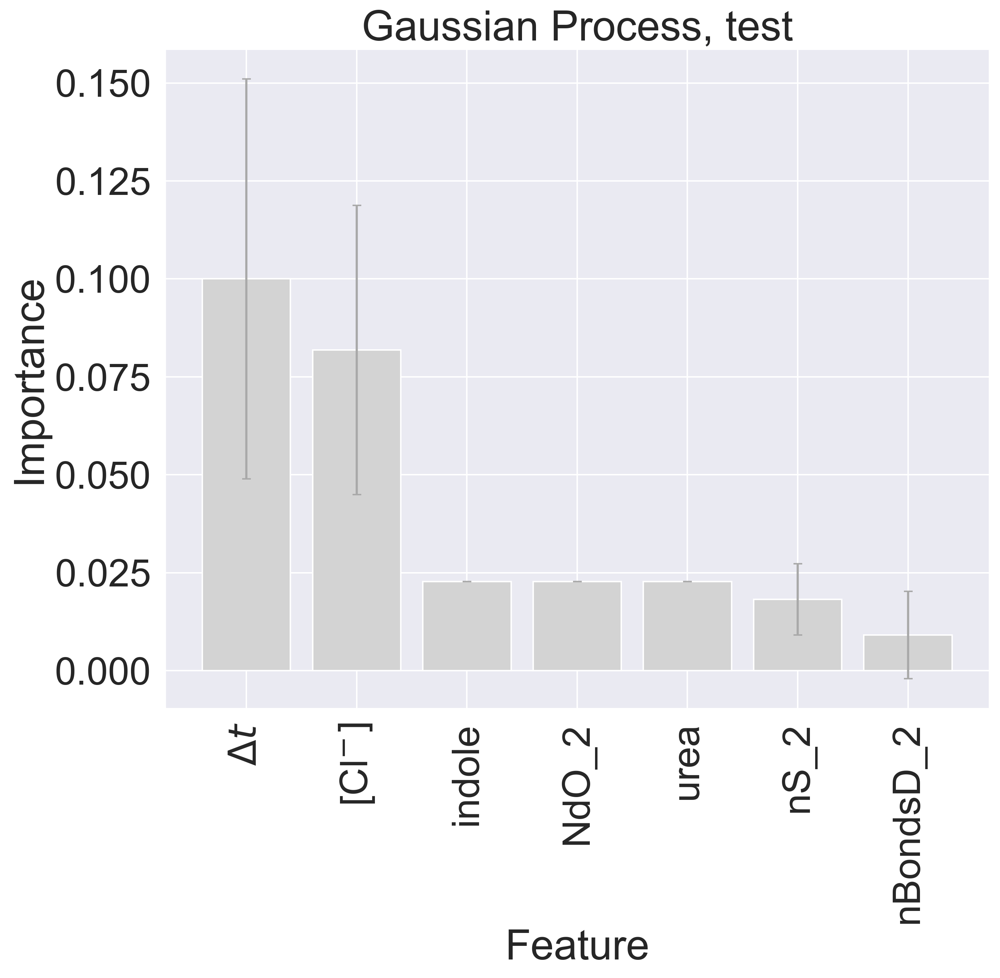

on train set
Gaussian Process


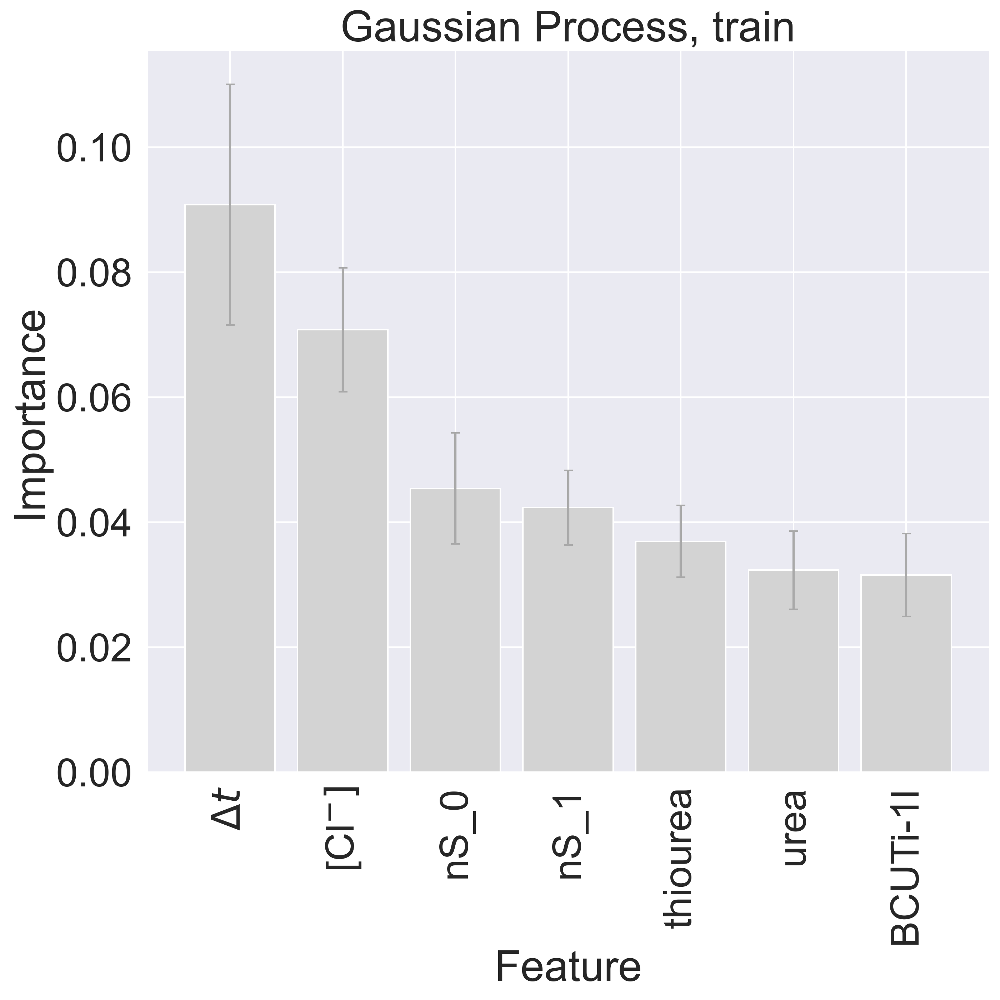

on all set
Gaussian Process


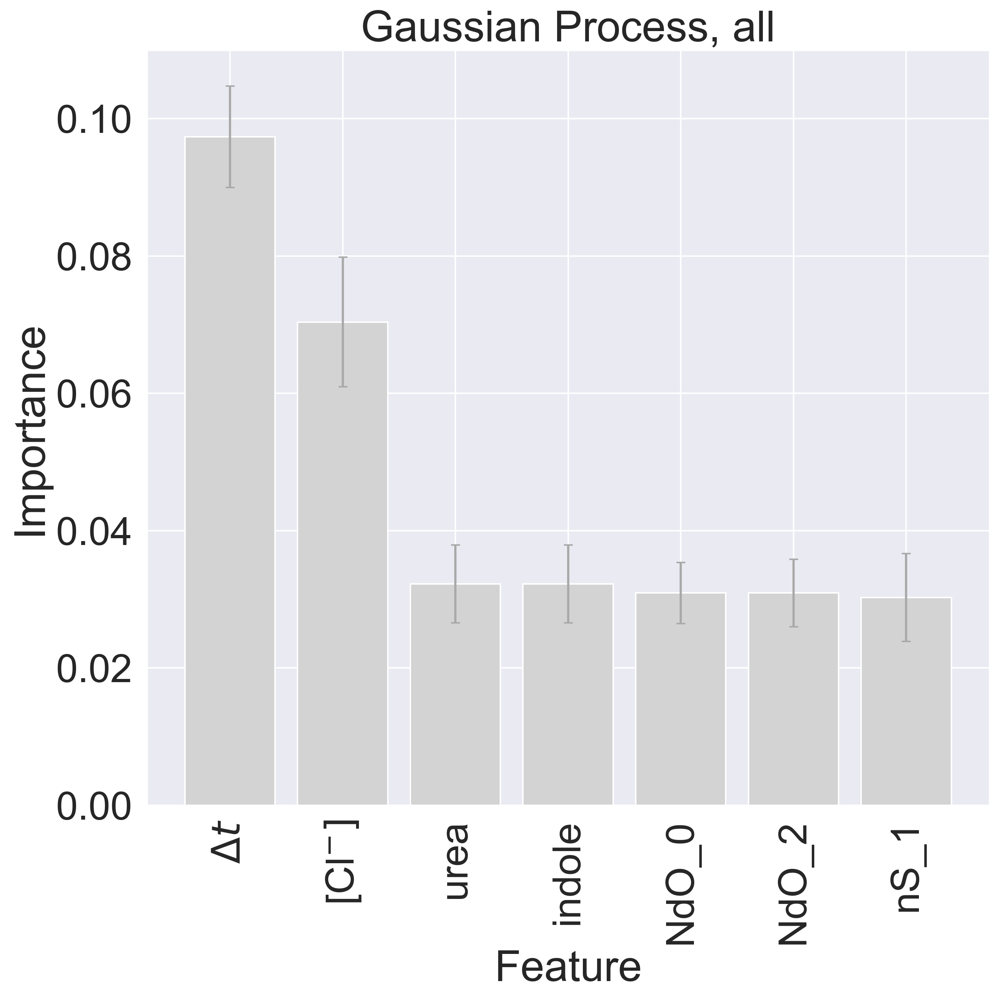

model_Logistic_Regression.sav
on test set
Logistic Regression


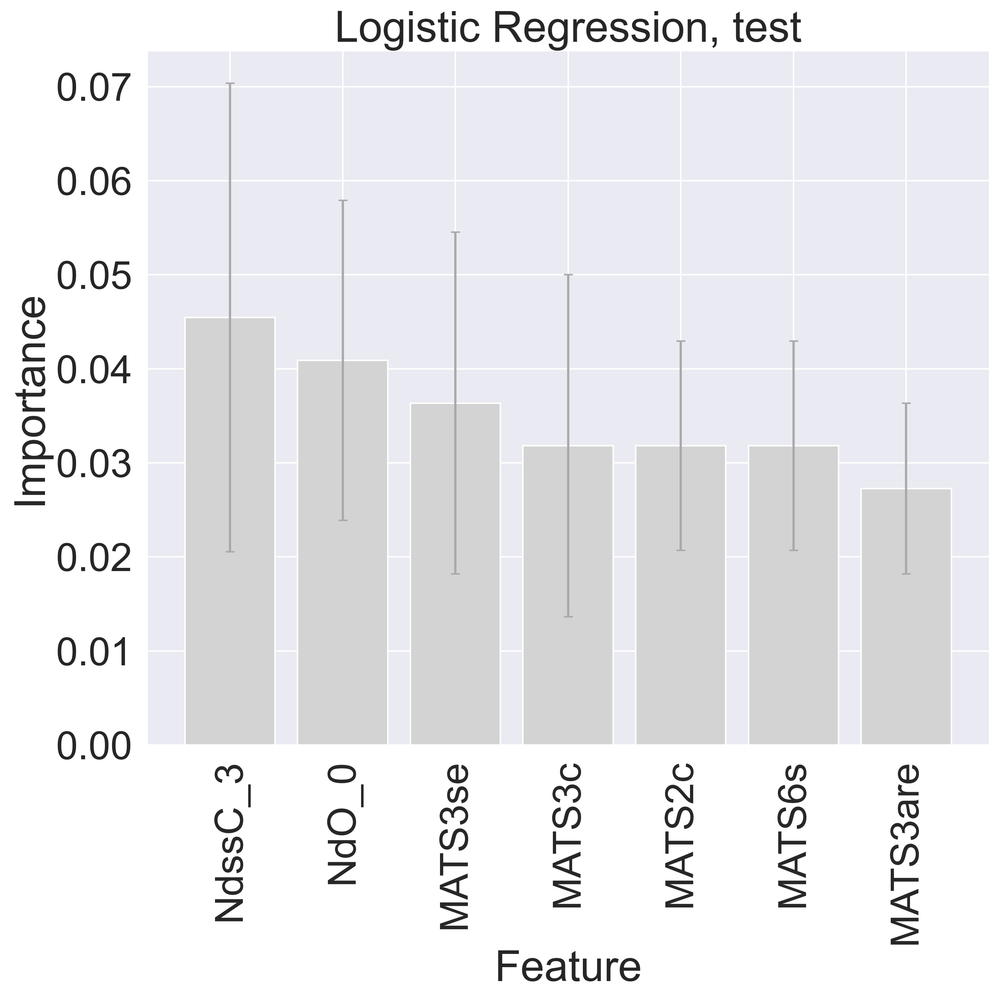

on train set
Logistic Regression


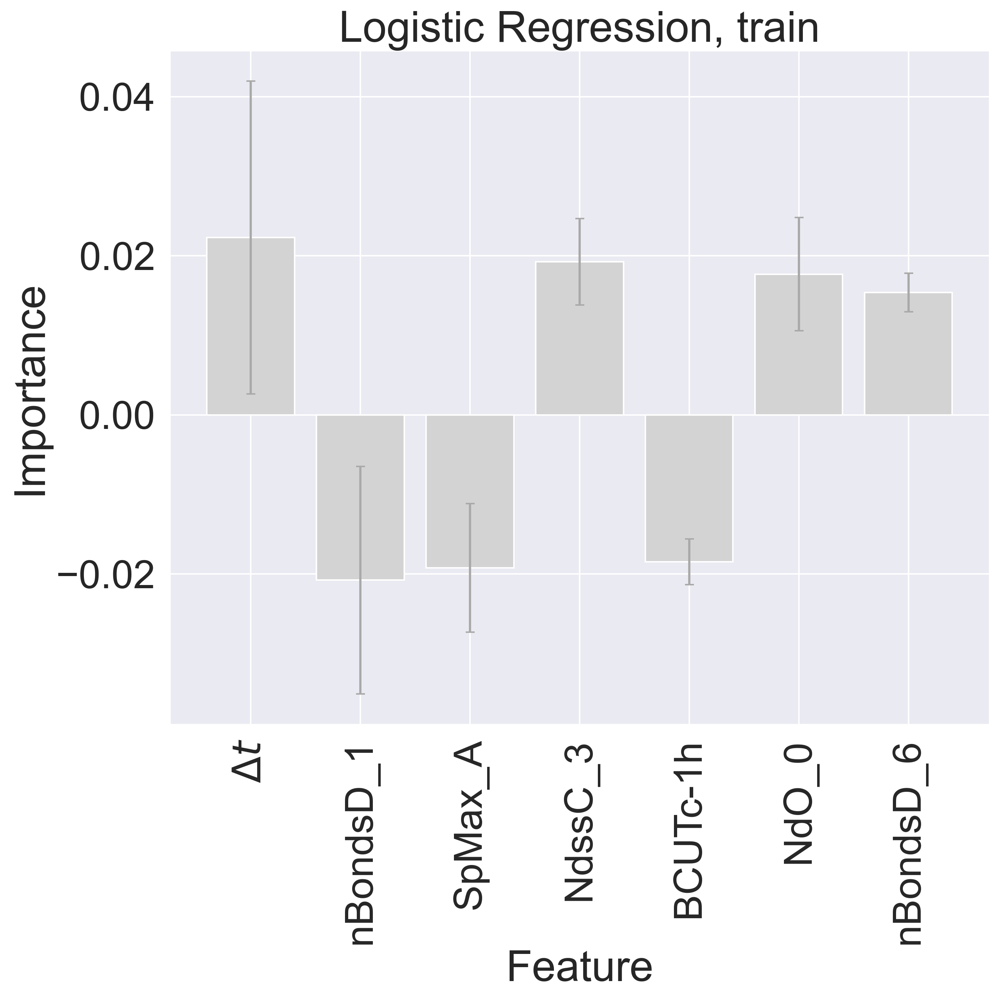

on all set
Logistic Regression


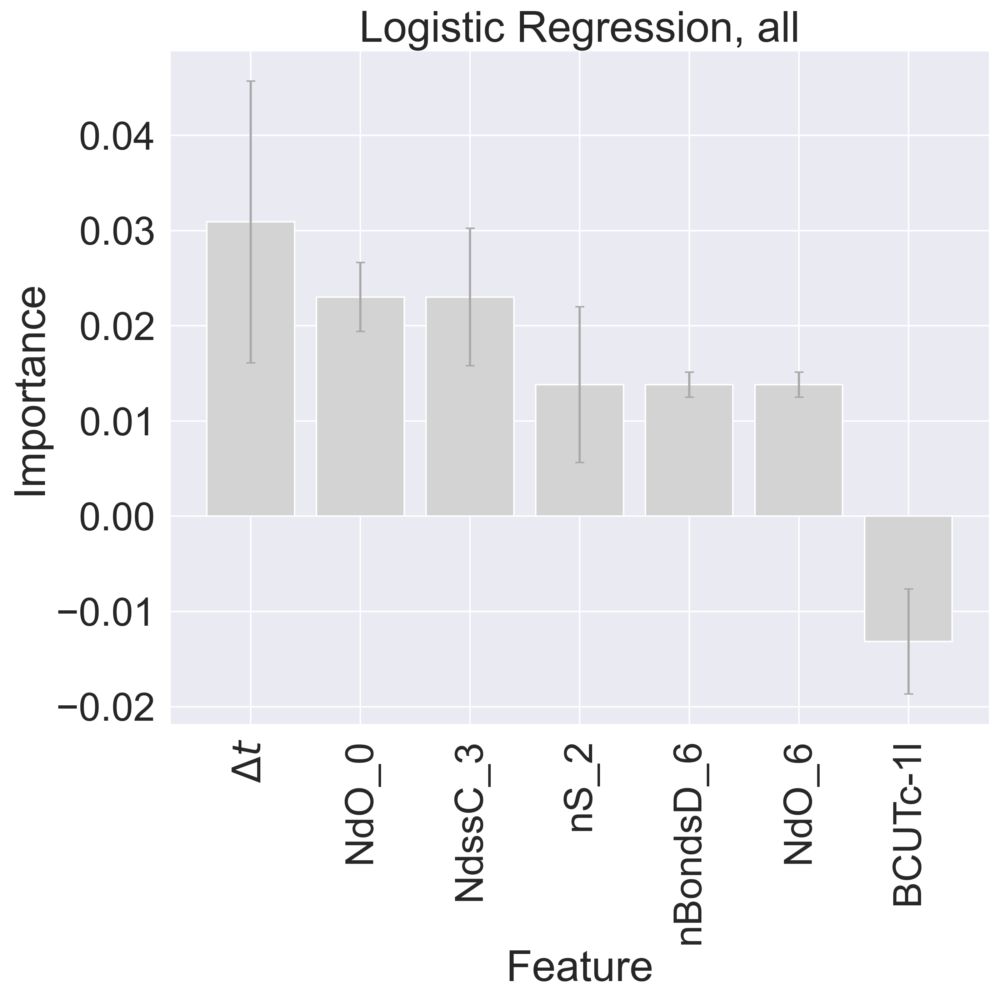

In [237]:
for i in range(len(model_files)):
    model_file = model_files[i]

    print(model_file)

    print("on test set")
    cmetrics.calculate_permutation_importance(model_file, x=Xtest, y=Ytest, filename='test')

    print("on train set")
    cmetrics.calculate_permutation_importance(model_file, x=Xtrain, y=Ytrain, filename='train')

    print("on all set")
    cmetrics.calculate_permutation_importance(model_file, x=X, y=Y, filename='all')

### sklearn feature importance

model_ExtraTreesClassifier.sav
ExtraTreesClassifier


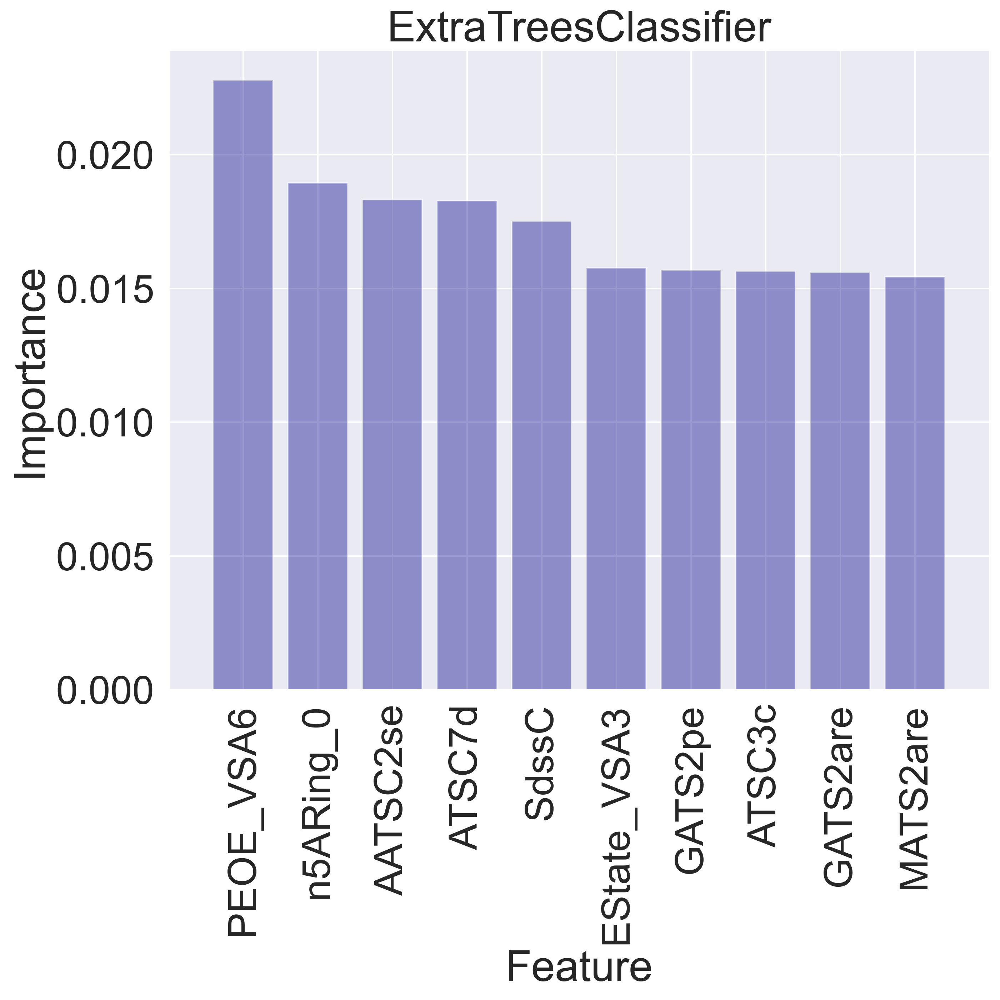

model_AdaBoost.sav
AdaBoost


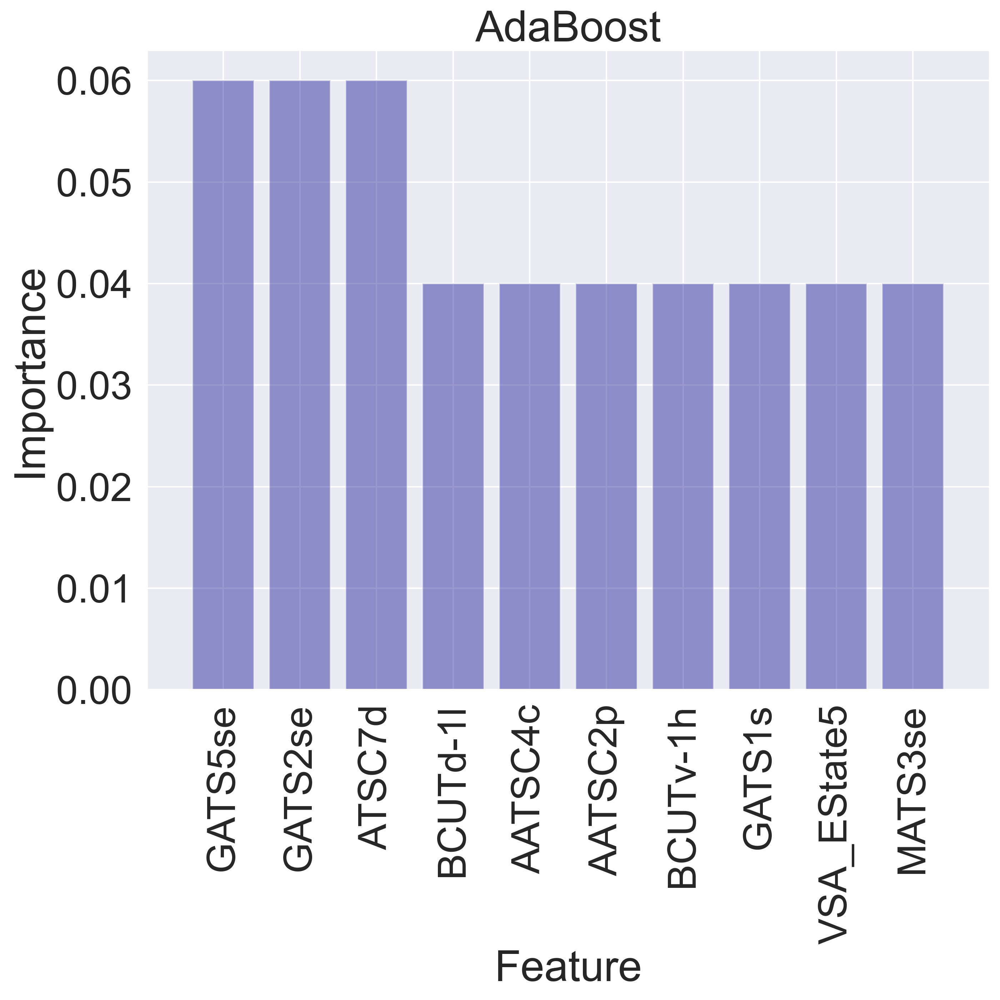

model_Decision_Tree.sav
Decision_Tree


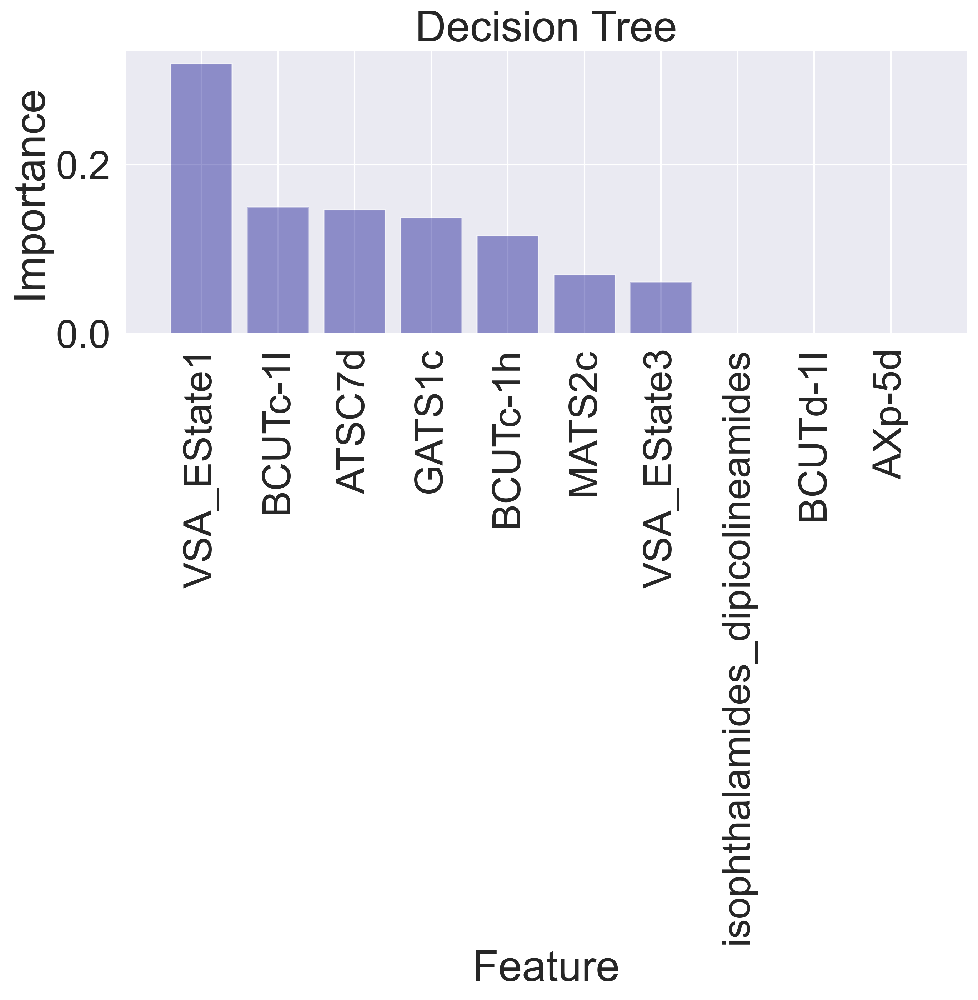

model_Gaussian_Process.sav
Gaussian_Process


In [238]:
# all except finalized_MLmodel_Nearest_Neighbors
for model_file in model_files :
    if model_file != "model_Nearest_Neighbors.sav":
        print(model_file)
        model_name = model_file.split(".")[0].replace("model_", "")
        print(model_name)
        clf_shap = joblib.load(model_file)
        
        if 'Tree' in model_name:
            #For tree like models you can use
            explainer = shap.TreeExplainer(clf_shap)
            importances = clf_shap.feature_importances_

        elif 'AdaBoost' in model_name:
            explainer = shap.KernelExplainer(clf_shap.predict_proba, Xtest)
            importances = clf_shap.feature_importances_

        elif 'Logistic' in model_name:
            #explaining model
            explainer = shap.KernelExplainer(clf_shap.predict_proba, Xtest)
            importances = clf_shap.coef_[0]
        else:
            break


        indices = np.argsort(importances)[::-1]
        features_names = Xtrain.columns
        features = []
        for a in features_names:
            if str(a).startswith("time_between_transporter_added_and_lysis_(s)"):
                a= str(a).replace("time_between_transporter_added_and_lysis_(s)","$\Delta t$")
            if str(a).startswith("cl_conc_(mm)"):
                a= str(a).replace("cl_conc_(mm)", "[Cl$^{-}]$")
            features.append(str(a))

        # create a list of feature names and their importance
        feature_importance = []
        for f in range(Xtrain.shape[1]):
            feature_importance.append((features[indices[f]], importances[indices[f]]))
        df_feature_importance = pd.DataFrame(feature_importance, columns=["feature", "importance"])

        # plot the N most important features
        N = 10
        plt.figure(figsize=(10,10), dpi=300)
        plt.title("{}".format(model_name.replace("_", " ")))
        # set background color to white
        plt.bar(range(N), [val[1] for val in feature_importance[:N]], align="center", color="darkblue", alpha=0.4)
        plt.xticks(range(N), [val[0] for val in feature_importance[:N]], rotation=90)
        plt.xlim([-1, N])
        plt.ylabel("Importance")
        plt.xlabel("Feature")


        plt.tight_layout()
        plt.savefig("fig_feature_importance_{}.png".format(model_name))
        plt.show()

### SHAP analysis

In [239]:
# combine Xtrain and Xtest dataframes
X = pd.concat([Xtrain, Xtest])

y = np.concatenate((Ytrain['classes'], Ytest))

#### Summary plot - Gaussian process

In [240]:
# load model from .sav file
model_file = "model_Gaussian_Process.sav"
clf_shap = joblib.load(model_file)

Xk = shap.kmeans(X, 10)

#explaining model
explainer = shap.KernelExplainer(clf_shap.predict_proba, Xk)

shap_values_gp = explainer.shap_values(X)


  0%|          | 0/304 [00:00<?, ?it/s]num_full_subsets = 1
remaining_weight_vector = array([0.11501445, 0.07729969, 0.05844997, 0.04714642, 0.03961609,
       0.034242  , 0.03021566, 0.02708792, 0.0245893 , 0.02254829,
       0.02085057, 0.01941701, 0.01819106, 0.01713128, 0.01620658,
       0.01539319, 0.01467263, 0.01403029, 0.01345452, 0.01293587,
       0.0124666 , 0.01204035, 0.01165179, 0.01129647, 0.01097061,
       0.010671  , 0.01039489, 0.01013992, 0.00990402, 0.00968543,
       0.00948257, 0.0092941 , 0.00911879, 0.0089556 , 0.00880358,
       0.00866188, 0.00852978, 0.0084066 , 0.00829174, 0.00818467,
       0.00808492, 0.00799204, 0.00790565, 0.0078254 , 0.00775097,
       0.00768209, 0.00761848, 0.00755992, 0.00750621, 0.00745715,
       0.00741257, 0.00737234, 0.00733631, 0.00730438, 0.00727642,
       0.00725237, 0.00723215, 0.00721568, 0.00720293, 0.00719384,
       0.0071884 , 0.00718659])
num_paired_subset_sizes = 62
weight_left = 0.8136619807656926
np.sum(w_aug) = 

In [241]:
# save shap values
shap_values_gp_df = pd.DataFrame(shap_values_gp[1], columns = X.columns)
shap_values_gp_df.to_csv("shap_values_gp.csv", index=False)


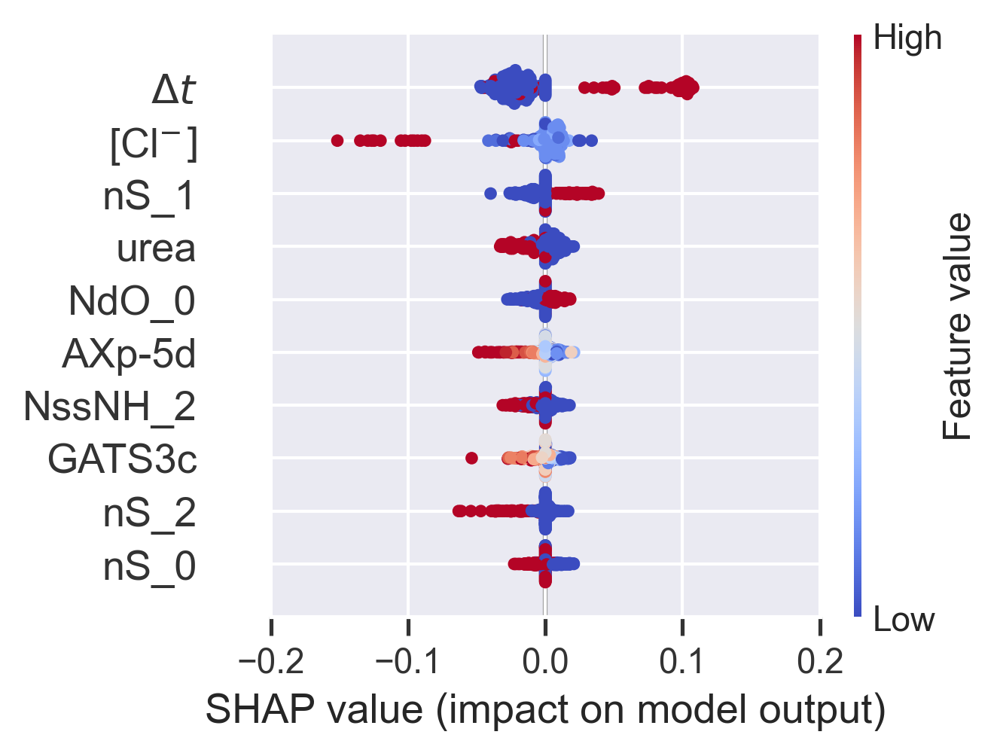

In [245]:
df_shap_values = pd.read_csv("shap_values_gp.csv")
shap_values_gp = df_shap_values.values

model_file = "model_Gaussian_Process.sav"
model_name = model_file.split(".")[0].split("model_")[-1]


fig = plt.figure(dpi = 300)
# Set the facecolor
fig.set_facecolor('white')

feature_names = []
for a,b in zip(X.columns, np.abs(shap_values_gp).mean(0).round(2)):
    if a == "time_between_transporter_added_and_lysis_(s)":
        a = "$\Delta t$"
    if a == "cl_conc_(mm)":
        a = "[Cl$^{-}]$"
    feature_names.append(str(a))

#cmap = sns.diverging_palette(230, 0, 90, 60, as_cmap=True)
cmap = sns.color_palette("coolwarm", as_cmap=True)

shap.summary_plot(shap_values_gp, X, max_display=10, cmap=cmap, show=False, feature_names=feature_names)

plt.gcf().set_size_inches(5,4)
plt.xlim([-0.2,0.2])
plt.tight_layout()
plt.savefig("shap_summary_plot_{}.png".format(model_name), dpi=300)
plt.show()

#### Summary plot - Extra tree

In [246]:
# load model from .sav file
model_file = "model_ExtraTreesClassifier.sav"
model_name = model_file.split(".")[0].split("model_")[-1]

clf_shap = joblib.load(model_file)
    
#For tree like models you can use
explainer = shap.TreeExplainer(clf_shap)

#For linear models you can use
shap_values_et = explainer.shap_values(X)

# save shap values
shap_values_et_df = pd.DataFrame(shap_values_et[1], columns = X.columns)
shap_values_et_df.to_csv("shap_values_et.csv", index=False)


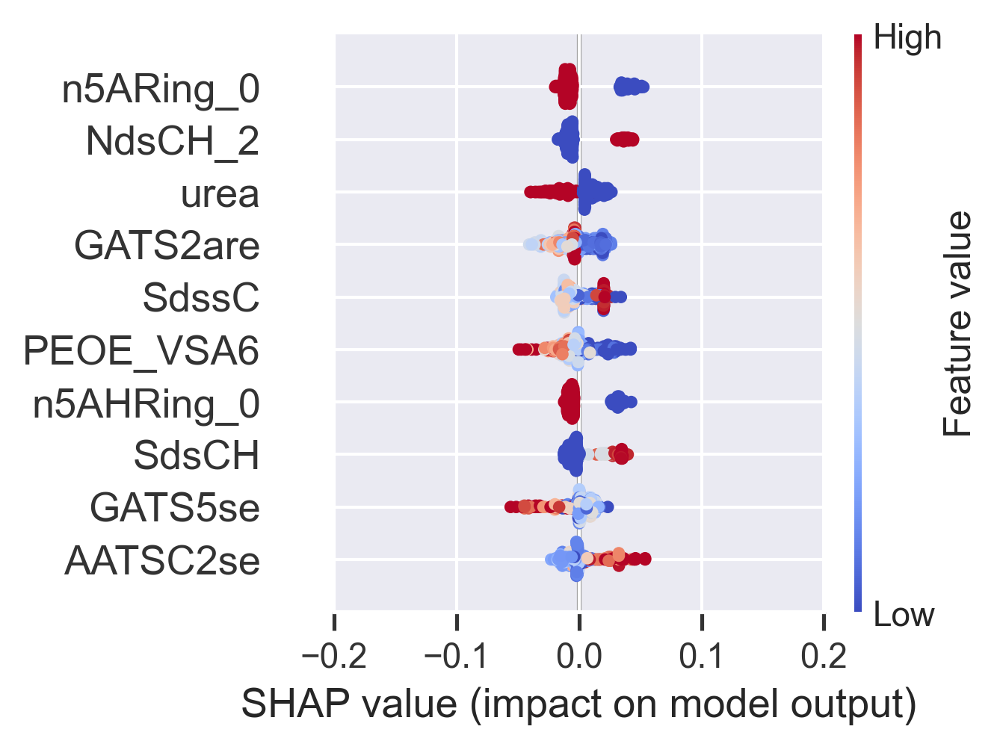

In [247]:
fig = plt.figure(dpi = 300)
# Set the facecolor
fig.set_facecolor('white')

feature_names = []
for a,b in zip(X.columns, np.abs(shap_values_et[1]).mean(0).round(2)):
    if str(a).startswith("time_between_transporter_added_and_lysis_(s)"):
        a= str(a).replace("time_between_transporter_added_and_lysis_(s)","$\Delta t$")
    if str(a).startswith("cl_conc_(mm)"):
        a= str(a).replace("cl_conc_(mm)", "[Cl$^{-}]$")
    feature_names.append(str(a))


#cmap = sns.diverging_palette(230, 0, 90, 60, as_cmap=True)
cmap = sns.color_palette("coolwarm", as_cmap=True)

shap.summary_plot(shap_values[1], X, max_display=10, cmap=cmap, show=False, feature_names=feature_names)

plt.gcf().set_size_inches(5,4)
plt.xlim([-0.2,0.2])
plt.tight_layout()
plt.savefig("shap_summary_plot_{}.png".format(model_name), dpi=300)
plt.show()